In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, auc
import seaborn as sns
from tqdm import tqdm
import json
from collections import defaultdict

In [3]:
import os
import shutil
import numpy as np
from sklearn.model_selection import StratifiedKFold, train_test_split
from tqdm import tqdm

BASE_SOURCE = "/kaggle/input/dataset-c/dataset_cancer_v1/dataset_cancer_v1/classificacao_binaria/400X"
TARGET_ROOT = "/kaggle/working/400X_structured"

CLASSES = ['benign', 'malignant']
SEED = 42
samples = []

for label, cls in enumerate(CLASSES):
    cls_dir = os.path.join(BASE_SOURCE, cls)
    if not os.path.exists(cls_dir):
        raise FileNotFoundError(f"Missing folder: {cls_dir}")

    for img in os.listdir(cls_dir):
        if img.lower().endswith(('.png', '.jpg', '.jpeg')):
            samples.append({
                'path': os.path.join(cls_dir, img),
                'label': label,
                'name': img
            })

X = np.array([s['path'] for s in samples])
y = np.array([s['label'] for s in samples])

print(f"Total images found: {len(X)}")

X_rest, X_test, y_rest, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=SEED
)

print(f"Train+Val: {len(X_rest)} | Test: {len(X_test)}")

def copy_files(files, labels, sub_path):
    for f_path, lbl in zip(files, labels):
        cls = CLASSES[lbl]
        dest_dir = os.path.join(TARGET_ROOT, sub_path, cls)
        os.makedirs(dest_dir, exist_ok=True)
        shutil.copy(f_path, os.path.join(dest_dir, os.path.basename(f_path)))

print("Saving test set...")
copy_files(X_test, y_test, "test")
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

print("Creating 5 folds...")
for fold, (train_idx, val_idx) in enumerate(skf.split(X_rest, y_rest), 1):
    print(f"Processing Fold {fold}...")
    copy_files(X_rest[train_idx], y_rest[train_idx], f"fold_{fold}/train")
    copy_files(X_rest[val_idx], y_rest[val_idx], f"fold_{fold}/val")

print("\nDataset structuring complete!")
print(f"Structured dataset saved at: {TARGET_ROOT}")




Total images found: 1820
Train+Val: 1456 | Test: 364
Saving test set...
Creating 5 folds...
Processing Fold 1...
Processing Fold 2...
Processing Fold 3...
Processing Fold 4...
Processing Fold 5...

Dataset structuring complete!
Structured dataset saved at: /kaggle/working/400X_structured


In [4]:
CONFIG = {
    # Paths
    'data_root': '/kaggle/working/400X_structured',
    'output_dir': '/kaggle/working/400x_res',
    'checkpoint_dir': '/kaggle/working/400x_res/checkpoints',


    # Model
    'dinov2_model': 'dinov2_vitl14',  # ViT-L/14
    'feature_dim': 1024,  # DINOv2 ViT-L/14 output dimension
    'num_classes': 2,

    # MLP Architecture
    'hidden_dims': [512, 256],
    'dropout': 0.2,

    # Training
    'batch_size': 16,
    'num_epochs': 110,
    'learning_rate': 1e-4,  # Can try 1e-3 or 5e-4
    'weight_decay': 1e-3,

    # Callbacks
    'early_stopping_patience': 12,
    'reduce_lr_patience': 5,
    'reduce_lr_factor': 0.5,
    'min_lr': 1e-6,

    # Data
    'img_size': 224,
    'num_workers': 4,

    # Other
    'random_seed': 42,
    'save_attention_maps': False,

}

# Create output directories
os.makedirs(CONFIG['output_dir'], exist_ok=True)
os.makedirs(CONFIG['checkpoint_dir'], exist_ok=True)

# Set random seeds
torch.manual_seed(CONFIG['random_seed'])
np.random.seed(CONFIG['random_seed'])
if torch.cuda.is_available():
    torch.cuda.manual_seed(CONFIG['random_seed'])

print("Configuration loaded successfully!")

Configuration loaded successfully!


In [5]:
# ImageNet/DINOv2 normalization statistics
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# Heavy augmentation for training
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(CONFIG['img_size'], scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])


# Minimal preprocessing for validation and test
val_test_transforms = transforms.Compose([
    transforms.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    transforms.CenterCrop(CONFIG['img_size']),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print("Transforms defined successfully!")

Transforms defined successfully!


In [6]:
class BreastCancerDataset(Dataset):
    """Custom dataset for breast cancer histopathology images"""

    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.samples = []
        self.labels = []

        # Load benign samples (label 0)
        benign_dir = os.path.join(data_dir, 'benign')
        if os.path.exists(benign_dir):
            for img_name in os.listdir(benign_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')):
                    self.samples.append(os.path.join(benign_dir, img_name))
                    self.labels.append(0)

        # Load malignant samples (label 1)
        malignant_dir = os.path.join(data_dir, 'malignant')
        if os.path.exists(malignant_dir):
            for img_name in os.listdir(malignant_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')):
                    self.samples.append(os.path.join(malignant_dir, img_name))
                    self.labels.append(1)

        print(f"Loaded {len(self.samples)} images from {data_dir}")
        print(f"  Benign: {self.labels.count(0)}, Malignant: {self.labels.count(1)}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path = self.samples[idx]
        label = self.labels[idx]

        # Load image
        image = Image.open(img_path).convert('RGB')

        # Apply transforms
        if self.transform:
            image = self.transform(image)

        return image, label, img_path

    def get_class_counts(self):
        benign = self.labels.count(0)
        malignant = self.labels.count(1)
        return benign, malignant

print("Dataset class defined!")

Dataset class defined!


In [7]:
class DINOv2FeatureExtractor(nn.Module):
    """
    Correct DINOv2 feature extractor that returns:
    - CLS token
    - Patch tokens
    - TRUE attention weights (per layer)
    """
    def __init__(self, model_name='dinov2_vitl14', freeze=True):
        super().__init__()

        # Load the model from torch hub
        self.dinov2 = torch.hub.load('facebookresearch/dinov2', model_name)

        if freeze:
            for p in self.dinov2.parameters():
                p.requires_grad = False
            self.dinov2.eval()

        print(f"Loaded {model_name} (frozen={freeze})")

    def get_layer_attentions(self, x):
        """
        Manually extracts attention maps from all layers.
        This bypasses the 'MemEffAttention' attribute error.
        """
        attentions = []
        # Prepare tokens (CLS + Patches + Register tokens if any)
        x = self.dinov2.prepare_tokens_with_masks(x)

        for blk in self.dinov2.blocks:
            # Replicate the internal attention mechanism to get the weights
            B, N, C = x.shape
            # qkv projection
            qkv = blk.attn.qkv(x).reshape(B, N, 3, blk.attn.num_heads, C // blk.attn.num_heads).permute(2, 0, 3, 1, 4)
            q, k, v = qkv[0], qkv[1], qkv[2]

            # Compute attention matrix: Softmax(QK^T / sqrt(d))
            attn = (q @ k.transpose(-2, -1)) * blk.attn.scale
            attn = attn.softmax(dim=-1)

            attentions.append(attn)

            # Continue the forward pass for the next block
            x = blk(x)

        return attentions

    def forward(self, x, return_all=False):
        """
        Returns:
        cls_token: [B, D]
        patch_tokens: [B, N, D] (if return_all=True)
        attentions: List[[B, heads, tokens, tokens]] (if return_all=True)
        """
        if not return_all:
            # Standard efficient forward pass
            return self.dinov2(x)

        with torch.no_grad():
            # 1. Standard forward to get normalized features
            out = self.dinov2.forward_features(x)
            cls_token = out["x_norm_clstoken"]
            patch_tokens = out["x_norm_patchtokens"]

            # 2. Manual extraction of all attention maps
            attentions = self.get_layer_attentions(x)

            return cls_token, patch_tokens, attentions

print("DINOv2 Feature Extractor updated!")

DINOv2 Feature Extractor updated!


In [8]:
class MLPClassifier(nn.Module):
    """
    Simple MLP classifier trained on frozen DINOv2 features
    """

    def __init__(self, input_dim, hidden_dims, num_classes, dropout=0.3):
        super().__init__()

        layers = []
        prev_dim = input_dim

        for hidden_dim in hidden_dims:
            layers.extend([
                nn.Linear(prev_dim, hidden_dim),
                nn.ReLU(),
                nn.Dropout(dropout)
            ])
            prev_dim = hidden_dim

        # Output layer
        layers.append(nn.Linear(prev_dim, num_classes))

        self.mlp = nn.Sequential(*layers)

    def forward(self, x):
        return self.mlp(x)

print("MLP Classifier defined!")

MLP Classifier defined!


In [9]:
def calculate_class_weights(dataset):
    """
    Calculate inverse frequency weights for weighted loss
    """
    benign, malignant = dataset.get_class_counts()
    total = benign + malignant

    # Inverse frequency weights
    weight_benign = total / (2 * benign)
    weight_malignant = total / (2 * malignant)

    weights = torch.tensor([weight_benign, weight_malignant], dtype=torch.float32)

    print(f"Class weights calculated:")
    print(f"  Benign (class 0): {weight_benign:.4f}")
    print(f"  Malignant (class 1): {weight_malignant:.4f}")

    return weights

print("Class weight calculation function defined!")

Class weight calculation function defined!


In [10]:
def train_epoch(feature_extractor, classifier, dataloader, criterion, optimizer, device):
    """Train for one epoch"""
    classifier.train()
    feature_extractor.eval()

    running_loss = 0.0
    all_preds = []
    all_labels = []
    all_probs = []

    for images, labels, _ in tqdm(dataloader, desc="Training", leave=False):
        images, labels = images.to(device), labels.to(device)

        # Extract features
        with torch.no_grad():
            features = feature_extractor(images)

        # Forward pass through classifier
        optimizer.zero_grad()
        outputs = classifier(features)
        loss = criterion(outputs, labels)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        running_loss += loss.item() * images.size(0)
        probs = torch.softmax(outputs, dim=1)
        preds = torch.argmax(outputs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs[:, 1].detach().cpu().numpy())

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = np.mean(np.array(all_preds) == np.array(all_labels))
    epoch_auroc = roc_auc_score(all_labels, all_probs)

    return epoch_loss, epoch_acc, epoch_auroc


def validate_epoch(feature_extractor, classifier, dataloader, criterion, device):
    """Validate for one epoch"""
    classifier.eval()
    feature_extractor.eval()

    running_loss = 0.0
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels, _ in tqdm(dataloader, desc="Validation", leave=False):
            images, labels = images.to(device), labels.to(device)

            # Extract features
            features = feature_extractor(images)

            # Forward pass
            outputs = classifier(features)
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * images.size(0)
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs[:, 1].cpu().numpy())

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = np.mean(np.array(all_preds) == np.array(all_labels))
    epoch_auroc = roc_auc_score(all_labels, all_probs)

    return epoch_loss, epoch_acc, epoch_auroc, all_preds, all_labels, all_probs

print("Training and validation functions defined!")

Training and validation functions defined!


In [11]:
def train_fold(fold_num, feature_extractor, classifier, train_loader, val_loader,
               criterion, optimizer, scheduler, device, config):
    """
    Train one fold with early stopping and learning rate scheduling
    """
    print(f"\n{'='*60}")
    print(f"Training Fold {fold_num}")
    print(f"{'='*60}")

    best_val_auroc = 0.0
    best_epoch = 0
    patience_counter = 0

    history = {
        'train_loss': [], 'train_acc': [], 'train_auroc': [],
        'val_loss': [], 'val_acc': [], 'val_auroc': []
    }

    for epoch in range(config['num_epochs']):
        print(f"\nEpoch {epoch+1}/{config['num_epochs']}")
        print("-" * 40)
        current_lr = optimizer.param_groups[0]['lr'] 

        # Train
        train_loss, train_acc, train_auroc = train_epoch(
            feature_extractor, classifier, train_loader, criterion, optimizer, device
        )

        # Validate
        val_loss, val_acc, val_auroc, _, _, _ = validate_epoch(
            feature_extractor, classifier, val_loader, criterion, device
        )

        # Update history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['train_auroc'].append(train_auroc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auroc'].append(val_auroc)

        # Print metrics
        print(f"Train - Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, AUROC: {train_auroc:.4f}")
        print(f"Val   - Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, AUROC: {val_auroc:.4f}")
        # Save epoch metrics (crash-safe)
        metrics_path = os.path.join(
            config['output_dir'], f'fold_{fold_num}_metrics.csv'
        )
        
        header = not os.path.exists(metrics_path)
        with open(metrics_path, 'a') as f:
            if header:
                f.write("epoch,train_loss,train_acc,train_auroc,val_loss,val_acc,val_auroc,lr\n")
            f.write(
                f"{epoch+1},{train_loss},{train_acc},{train_auroc},"
                f"{val_loss},{val_acc},{val_auroc},{current_lr}\n"
            )


        # Learning rate scheduling
        scheduler.step(val_auroc)
        current_lr = optimizer.param_groups[0]['lr']
        print(f"Learning Rate: {current_lr:.6f}")

        # Early stopping check
        if val_auroc > best_val_auroc:
            best_val_auroc = val_auroc
            best_epoch = epoch + 1
            patience_counter = 0

            # Save best model
            checkpoint_path = os.path.join(
                config['checkpoint_dir'], f'fold_{fold_num}_best.pth'
            )
            torch.save({
                'epoch': epoch,
                'classifier_state_dict': classifier.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_val_auroc': best_val_auroc,
                'history': history
            }, checkpoint_path)
            print(f"✓ New best model saved (AUROC: {best_val_auroc:.4f})")
        else:
            patience_counter += 1
            print(f"Early stopping patience: {patience_counter}/{config['early_stopping_patience']}")

        # Early stopping
        if patience_counter >= config['early_stopping_patience']:
            print(f"\nEarly stopping triggered at epoch {epoch+1}")
            print(f"Best validation AUROC: {best_val_auroc:.4f} at epoch {best_epoch}")
            break

    return history, best_val_auroc, best_epoch

print("Training loop function defined!")

Training loop function defined!


In [12]:
def train_all_folds(config):
    """
    Train all 5 folds and aggregate results (Multi-GPU Kaggle safe)
    """
    all_fold_histories = []
    all_fold_results = []

    # ---- Feature extractor (shared across folds) ----
    feature_extractor = DINOv2FeatureExtractor(
        model_name=config['dinov2_model'],
        freeze=True
    )

    if torch.cuda.device_count() > 1:
        print("Using DataParallel for DINOv2 feature extractor")
        feature_extractor = nn.DataParallel(feature_extractor)

    feature_extractor = feature_extractor.to(device)
    feature_extractor.eval()

    for fold_num in range(1, 6):
        print(f"\n{'#'*60}")
        print(f"# FOLD {fold_num}/5")
        print(f"{'#'*60}")

        train_dir = os.path.join(config['data_root'], f'fold_{fold_num}', 'train')
        val_dir   = os.path.join(config['data_root'], f'fold_{fold_num}', 'val')

        train_dataset = BreastCancerDataset(train_dir, transform=train_transforms)
        val_dataset   = BreastCancerDataset(val_dir, transform=val_test_transforms)

        class_weights = calculate_class_weights(train_dataset).to(device)

        train_loader = DataLoader(
            train_dataset,
            batch_size=config['batch_size'],
            shuffle=True,
            num_workers=config['num_workers'],
            pin_memory=True
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=config['batch_size'],
            shuffle=False,
            num_workers=config['num_workers'],
            pin_memory=True
        )

        # ---- Classifier (new per fold) ----
        classifier = MLPClassifier(
            input_dim=config['feature_dim'],
            hidden_dims=config['hidden_dims'],
            num_classes=config['num_classes'],
            dropout=config['dropout']
        )

        if torch.cuda.device_count() > 1:
            classifier = nn.DataParallel(classifier)

        classifier = classifier.to(device)

        criterion = nn.CrossEntropyLoss(weight=class_weights)

        optimizer = torch.optim.AdamW(
            classifier.parameters(),
            lr=config['learning_rate'],
            weight_decay=config['weight_decay']
        )

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode='max',
            factor=config['reduce_lr_factor'],
            patience=config['reduce_lr_patience'],
            min_lr=config['min_lr']
        )

        history, best_auroc, best_epoch = train_fold(
            fold_num,
            feature_extractor,
            classifier,
            train_loader,
            val_loader,
            criterion,
            optimizer,
            scheduler,
            device,
            config
        )

        all_fold_histories.append(history)
        all_fold_results.append({
            'fold': fold_num,
            'best_val_auroc': best_auroc,
            'best_epoch': best_epoch,
            'final_train_auroc': history['train_auroc'][-1],
            'final_val_auroc': history['val_auroc'][-1]
        })

        fold_out = os.path.join(config['output_dir'], f'fold_{fold_num}')
        os.makedirs(fold_out, exist_ok=True)

        with open(os.path.join(fold_out, 'summary.json'), 'w') as f:
            json.dump(all_fold_results[-1], f, indent=4)

        print(f"Fold {fold_num} complete | Best AUROC: {best_auroc:.4f}")

        del classifier, optimizer, scheduler
        torch.cuda.empty_cache()

    return all_fold_histories, all_fold_results, feature_extractor


In [13]:
def plot_fold_metrics(history, fold_num, save_dir):
    """
    Plot training curves for a single fold
    """
    epochs = range(1, len(history['train_loss']) + 1)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Loss
    axes[0].plot(epochs, history['train_loss'], 'b-', label='Train', linewidth=2)
    axes[0].plot(epochs, history['val_loss'], 'r-', label='Validation', linewidth=2)
    axes[0].set_xlabel('Epoch', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title(f'Fold {fold_num} - Loss', fontsize=14, fontweight='bold')
    axes[0].legend(fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(epochs, history['train_acc'], 'b-', label='Train', linewidth=2)
    axes[1].plot(epochs, history['val_acc'], 'r-', label='Validation', linewidth=2)
    axes[1].set_xlabel('Epoch', fontsize=12)
    axes[1].set_ylabel('Accuracy', fontsize=12)
    axes[1].set_title(f'Fold {fold_num} - Accuracy', fontsize=14, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3)

    # AUROC
    axes[2].plot(epochs, history['train_auroc'], 'b-', label='Train', linewidth=2)
    axes[2].plot(epochs, history['val_auroc'], 'r-', label='Validation', linewidth=2)
    axes[2].set_xlabel('Epoch', fontsize=12)
    axes[2].set_ylabel('AUROC', fontsize=12)
    axes[2].set_title(f'Fold {fold_num} - AUROC', fontsize=14, fontweight='bold')
    axes[2].legend(fontsize=10)
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, f'fold_{fold_num}_metrics.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


def plot_aggregated_metrics(all_histories, save_dir):
    """
    Plot mean ± std across all folds
    """
    # Find maximum epoch length
    max_epochs = max(len(h['train_loss']) for h in all_histories)

    # Pad histories to same length (fill with last value)
    padded_histories = defaultdict(list)
    for history in all_histories:
        for key in ['train_loss', 'val_loss', 'train_auroc', 'val_auroc']:
            padded = list(history[key])
            if len(padded) < max_epochs:
                padded.extend([padded[-1]] * (max_epochs - len(padded)))
            padded_histories[key].append(padded)

    # Calculate mean and std
    metrics_stats = {}
    for key in padded_histories:
        arr = np.array(padded_histories[key])
        metrics_stats[key + '_mean'] = np.mean(arr, axis=0)
        metrics_stats[key + '_std'] = np.std(arr, axis=0)

    epochs = range(1, max_epochs + 1)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Loss
    axes[0].plot(epochs, metrics_stats['train_loss_mean'], 'b-', label='Train', linewidth=2)
    axes[0].fill_between(epochs,
                          metrics_stats['train_loss_mean'] - metrics_stats['train_loss_std'],
                          metrics_stats['train_loss_mean'] + metrics_stats['train_loss_std'],
                          alpha=0.2, color='b')
    axes[0].plot(epochs, metrics_stats['val_loss_mean'], 'r-', label='Validation', linewidth=2)
    axes[0].fill_between(epochs,
                          metrics_stats['val_loss_mean'] - metrics_stats['val_loss_std'],
                          metrics_stats['val_loss_mean'] + metrics_stats['val_loss_std'],
                          alpha=0.2, color='r')
    axes[0].set_xlabel('Epoch', fontsize=12)
    axes[0].set_ylabel('Loss', fontsize=12)
    axes[0].set_title('Mean Loss Across 5 Folds (± 1 SD)', fontsize=14, fontweight='bold')
    axes[0].legend(fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # AUROC
    axes[1].plot(epochs, metrics_stats['train_auroc_mean'], 'b-', label='Train', linewidth=2)
    axes[1].fill_between(epochs,
                          metrics_stats['train_auroc_mean'] - metrics_stats['train_auroc_std'],
                          metrics_stats['train_auroc_mean'] + metrics_stats['train_auroc_std'],
                          alpha=0.2, color='b')
    axes[1].plot(epochs, metrics_stats['val_auroc_mean'], 'r-', label='Validation', linewidth=2)
    axes[1].fill_between(epochs,
                          metrics_stats['val_auroc_mean'] - metrics_stats['val_auroc_std'],
                          metrics_stats['val_auroc_mean'] + metrics_stats['val_auroc_std'],
                          alpha=0.2, color='r')
    axes[1].set_xlabel('Epoch', fontsize=12)
    axes[1].set_ylabel('AUROC', fontsize=12)
    axes[1].set_title('Mean AUROC Across 5 Folds (± 1 SD)', fontsize=14, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'aggregated_metrics.png'), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


def plot_confusion_matrix(cm, title, save_path):
    """
    Plot confusion matrix
    """
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign', 'Malignant'],
                yticklabels=['Benign', 'Malignant'],
                cbar_kws={'label': 'Count'})
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


def plot_roc_curve(fpr, tpr, roc_auc, title, save_path):
    """
    Plot ROC curve
    """
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.legend(loc="lower right", fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

print("Visualization functions defined!")

Visualization functions defined!


In [14]:
def evaluate_test_set(feature_extractor, config):
    """
    Evaluate all 5 fold models on the independent test set
    """
    print(f"\n{'='*60}")
    print("EVALUATING ON TEST SET")
    print(f"{'='*60}\n")

    # Load test dataset
    test_dir = os.path.join(config['data_root'], 'test')
    test_dataset = BreastCancerDataset(test_dir, transform=val_test_transforms)
    test_loader = DataLoader(
        test_dataset,
        batch_size=config['batch_size'],
        shuffle=False,
        num_workers=config['num_workers'],
        pin_memory=True
    )

    all_fold_predictions = []
    all_fold_probabilities = []

    # Evaluate each fold's best model
    for fold_num in range(1, 6):
        print(f"Loading Fold {fold_num} best model...")

        # Initialize classifier
        classifier = MLPClassifier(
            input_dim=config['feature_dim'],
            hidden_dims=config['hidden_dims'],
            num_classes=config['num_classes'],
            dropout=config['dropout']
        ).to(device)

        # Load best checkpoint
        checkpoint_path = os.path.join(
            config['checkpoint_dir'], f'fold_{fold_num}_best.pth'
        )

        checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
        classifier.load_state_dict(checkpoint['classifier_state_dict'])

        # Evaluate
        classifier.eval()
        feature_extractor.eval()

        fold_preds = []
        fold_probs = []
        fold_labels = []

        with torch.no_grad():
            for images, labels, _ in tqdm(test_loader, desc=f"Fold {fold_num}", leave=False):
                images = images.to(device)

                # Extract features
                features = feature_extractor(images)

                # Predict
                outputs = classifier(features)
                probs = torch.softmax(outputs, dim=1)
                preds = torch.argmax(outputs, dim=1)

                fold_preds.extend(preds.cpu().numpy())
                fold_probs.extend(probs[:, 1].cpu().numpy())
                fold_labels.extend(labels.numpy())

        all_fold_predictions.append(fold_preds)
        all_fold_probabilities.append(fold_probs)

        print(f"  Fold {fold_num} evaluation complete.")

    # Ensemble: Average probabilities across folds
    ensemble_probs = np.mean(all_fold_probabilities, axis=0)
    ensemble_preds = (ensemble_probs > 0.5).astype(int)
    true_labels = np.array(fold_labels)  # Same for all folds

    # Calculate metrics
    test_acc = np.mean(ensemble_preds == true_labels)
    test_auroc = roc_auc_score(true_labels, ensemble_probs)
    cm = confusion_matrix(true_labels, ensemble_preds)
    fpr, tpr, _ = roc_curve(true_labels, ensemble_probs)

    print(f"\n{'='*60}")
    print("TEST SET RESULTS (Ensemble)")
    print(f"{'='*60}")
    print(f"Accuracy: {test_acc:.4f}")
    print(f"AUROC: {test_auroc:.4f}")
    print(f"\nConfusion Matrix:")
    print(cm)

    # Plot confusion matrix
    plot_confusion_matrix(
        cm,
        'Test Set Confusion Matrix (Ensemble)',
        os.path.join(config['output_dir'], 'test_confusion_matrix.png')
    )

    # Plot ROC curve
    plot_roc_curve(
        fpr, tpr, test_auroc,
        'Test Set ROC Curve (Ensemble)',
        os.path.join(config['output_dir'], 'test_roc_curve.png')
    )

    # Save predictions - FIX: Convert numpy types to Python native types
    test_results = {
        'true_labels': [int(x) for x in true_labels],  # Convert to Python int
        'ensemble_predictions': [int(x) for x in ensemble_preds],  # Convert to Python int
        'ensemble_probabilities': [float(x) for x in ensemble_probs],  # Convert to Python float
        'accuracy': float(test_acc),
        'auroc': float(test_auroc),
        'confusion_matrix': [[int(x) for x in row] for row in cm]  # Convert each element
    }

    with open(os.path.join(config['output_dir'], 'test_results.json'), 'w') as f:
        json.dump(test_results, f, indent=4)

    print(f"\nTest results saved to: {os.path.join(config['output_dir'], 'test_results.json')}")

    return test_results

print("Test evaluation function defined!")

Test evaluation function defined!


In [15]:
class AttentionRollout:
    """
    Attention Rollout for ViTs (spatial tokens only)
    """

    def __init__(self):
        pass

    def __call__(self, attentions, num_patches):
        """
        Args:
            attentions: list of [B, H, T, T]
            num_patches: number of spatial patches (N)

        Returns:
            rollout: [B, N] CLS → patch attention
        """

        # Average heads
        attns = [a.mean(dim=1) for a in attentions]  # [B, T, T]

        # Identity for residual
        eye = torch.eye(attns[0].size(-1), device=attns[0].device).unsqueeze(0)

        attns = [(a + eye) / (a + eye).sum(dim=-1, keepdim=True) for a in attns]

        # Rollout
        rollout = attns[0]
        for a in attns[1:]:
            rollout = torch.matmul(a, rollout)

        # CLS → spatial patches ONLY
        cls_to_patches = rollout[:, 0, 1:1 + num_patches]

        return cls_to_patches


    def visualize(self, image, attention, save_path=None):
        """
        Overlay attention map on original image
        """
        # Reshape attention to 2D grid
        h = w = int(np.sqrt(attention.shape[0]))
        attention_2d = attention.reshape(h, w)

        # Resize to match image size
        attention_resized = np.array(Image.fromarray(attention_2d).resize(
            (image.shape[1], image.shape[0]), Image.BILINEAR
        ))

        # Normalize to [0, 1]
        attention_resized = (attention_resized - attention_resized.min()) / \
                           (attention_resized.max() - attention_resized.min() + 1e-8)

        # Create heatmap
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        # Original image
        axes[0].imshow(image)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        # Attention map
        axes[1].imshow(attention_resized, cmap='jet')
        axes[1].set_title('Attention Rollout')
        axes[1].axis('off')

        # Overlay
        axes[2].imshow(image)
        axes[2].imshow(attention_resized, cmap='jet', alpha=0.5)
        axes[2].set_title('Overlay')
        axes[2].axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()

print("Attention Rollout defined!")

Attention Rollout defined!


In [16]:
class OcclusionSensitivity:
    """
    Generate occlusion sensitivity maps
    """

    def __init__(self, patch_size=28, stride=14):
        self.patch_size = patch_size
        self.stride = stride

    def __call__(self, image, feature_extractor, classifier, device):
        """
        Args:
            image: Input image tensor [1, 3, H, W]
            feature_extractor: DINOv2 model
            classifier: MLP classifier
            device: torch device

        Returns:
            sensitivity_map: [H, W] importance scores
        """
        _, _, h, w = image.shape

        # Get baseline prediction
        with torch.no_grad():
            features = feature_extractor(image.to(device))
            baseline_output = classifier(features)
            baseline_prob = torch.softmax(baseline_output, dim=1)[0, 1].item()

        # Initialize sensitivity map
        sensitivity_map = np.zeros((h, w))
        count_map = np.zeros((h, w))

        # Calculate total iterations for progress bar
        total_iterations = len(range(0, h - self.patch_size + 1, self.stride)) * \
                          len(range(0, w - self.patch_size + 1, self.stride))

        # Slide occlusion patch with progress bar
        with tqdm(total=total_iterations, desc="Occlusion analysis", leave=False) as pbar:
            for y in range(0, h - self.patch_size + 1, self.stride):
                for x in range(0, w - self.patch_size + 1, self.stride):
                    # Create occluded image
                    occluded_image = image.clone()
                    occluded_image[:, :, y:y+self.patch_size, x:x+self.patch_size] = 0

                    # Get prediction on occluded image
                    with torch.no_grad():
                        features = feature_extractor(occluded_image.to(device))
                        output = classifier(features)
                        prob = torch.softmax(output, dim=1)[0, 1].item()

                    # Sensitivity = drop in probability
                    sensitivity = baseline_prob - prob

                    # Update map
                    sensitivity_map[y:y+self.patch_size, x:x+self.patch_size] += sensitivity
                    count_map[y:y+self.patch_size, x:x+self.patch_size] += 1

                    pbar.update(1)

        # Average overlapping regions
        sensitivity_map = sensitivity_map / (count_map + 1e-8)

        return sensitivity_map

    def visualize(self, image, sensitivity_map, save_path=None):
        """
        Visualize occlusion sensitivity
        """
        # Normalize
        sensitivity_map = (sensitivity_map - sensitivity_map.min()) / \
                         (sensitivity_map.max() - sensitivity_map.min() + 1e-8)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        # Original image
        axes[0].imshow(image)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        # Occlusion map
        axes[1].imshow(sensitivity_map, cmap='hot')
        axes[1].set_title('Occlusion Sensitivity')
        axes[1].axis('off')

        # Overlay
        axes[2].imshow(image)
        axes[2].imshow(sensitivity_map, cmap='hot', alpha=0.5)
        axes[2].set_title('Overlay')
        axes[2].axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()

print("Occlusion Sensitivity defined!")

Occlusion Sensitivity defined!


In [17]:
def compute_attention_occlusion_agreement(attention_map, occlusion_map, threshold=0.5):
    """
    Compute agreement between attention and occlusion maps

    Args:
        attention_map: Normalized attention weights [H, W]
        occlusion_map: Normalized occlusion sensitivity [H, W]
        threshold: Threshold for binarization

    Returns:
        agreement_score: IoU between top regions
    """
    # Binarize maps
    attn_binary = (attention_map > threshold).astype(int)
    occl_binary = (occlusion_map > threshold).astype(int)

    # Calculate IoU (Intersection over Union)
    intersection = np.logical_and(attn_binary, occl_binary).sum()
    union = np.logical_or(attn_binary, occl_binary).sum()

    iou = intersection / (union + 1e-8)

    # Pearson correlation
    correlation = np.corrcoef(attention_map.flatten(), occlusion_map.flatten())[0, 1]

    return {
        'iou': iou,
        'correlation': correlation
    }

print("Agreement metric defined!")

Agreement metric defined!


In [18]:
def perform_xai_analysis(feature_extractor, classifier, test_dataset, device,
                        config, num_samples=10):
    """
    Perform XAI analysis on sample test images
    """

    # ------------------ NEW HEADER ------------------
    print(f"\n{'#'*60}")
    print("#" + " " * 58 + "#")
    print("#" + " " * 15 + "STARTING XAI ANALYSIS" + " " * 22 + "#")
    print("#" + " " * 58 + "#")
    print(f"{'#'*60}\n")
    # ------------------------------------------------

    xai_dir = os.path.join(config['output_dir'], 'xai_analysis')
    os.makedirs(xai_dir, exist_ok=True)

    # Initialize XAI methods
    attention_rollout = AttentionRollout()
    occlusion_sensitivity = OcclusionSensitivity(patch_size=28, stride=14)

    # Select random samples
    indices = np.random.choice(len(test_dataset), num_samples, replace=False)

    agreement_scores = []

    for idx in indices:
        image, label, img_path = test_dataset[idx]
        image_batch = image.unsqueeze(0).to(device)

        print(f"Analyzing image {os.path.basename(img_path)} (Label: {'Malignant' if label else 'Benign'})")

        # Extract features + classifier output
        with torch.no_grad():
            features, patch_tokens, attention_maps = feature_extractor(
                image_batch, return_all=True
            )
            output = classifier(features)
            pred = torch.argmax(output, dim=1).item()
            prob = torch.softmax(output, dim=1)[0, 1].item()

        print(f"  Prediction: {'Malignant' if pred else 'Benign'} (prob: {prob:.4f})")

        # Attention Rollout

        attention_map = attention_rollout(attention_maps, patch_tokens.shape[1])

        attention_map_np = attention_map[0].cpu().numpy()

        # Occlusion
        occlusion_map = occlusion_sensitivity(
            image_batch, feature_extractor, classifier, device
        )

        # Resize + normalize attention
        h, w = occlusion_map.shape
        num_patches = patch_tokens.shape[1]
        patch_h = patch_w = int(np.sqrt(num_patches))
        assert patch_h * patch_w == num_patches

        attention_map_np = attention_map_np[:num_patches]
        attention_2d = attention_map_np.reshape(patch_h, patch_w)

        attention_resized = np.array(Image.fromarray(attention_2d).resize(
            (w, h), Image.BILINEAR
        ))

        attention_resized = (attention_resized - attention_resized.min()) / \
                           (attention_resized.max() - attention_resized.min() + 1e-8)
        occlusion_map_norm = (occlusion_map - occlusion_map.min()) / \
                            (occlusion_map.max() - occlusion_map.min() + 1e-8)

        # Agreement
        agreement = compute_attention_occlusion_agreement(
            attention_resized, occlusion_map_norm
        )
        agreement_scores.append(agreement)

        print(f"  Agreement - IoU: {agreement['iou']:.4f}, Correlation: {agreement['correlation']:.4f}")

        # ------ Visualization ------
        img_np = image.permute(1, 2, 0).numpy()
        img_np = img_np * np.array(IMAGENET_STD) + np.array(IMAGENET_MEAN)
        img_np = np.clip(img_np, 0, 1)

        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        axes[0, 0].imshow(img_np)
        axes[0, 0].set_title('Original')
        axes[0, 0].axis('off')

        axes[0, 1].imshow(attention_resized, cmap='jet')
        axes[0, 1].set_title('Attention Rollout')
        axes[0, 1].axis('off')

        axes[0, 2].imshow(img_np)
        axes[0, 2].imshow(attention_resized, cmap='jet', alpha=0.5)
        axes[0, 2].set_title('Attention Overlay')
        axes[0, 2].axis('off')

        axes[1, 0].imshow(img_np)
        axes[1, 0].set_title('Original')
        axes[1, 0].axis('off')

        axes[1, 1].imshow(occlusion_map_norm, cmap='hot')
        axes[1, 1].set_title('Occlusion Sensitivity')
        axes[1, 1].axis('off')

        axes[1, 2].imshow(img_np)
        axes[1, 2].imshow(occlusion_map_norm, cmap='hot', alpha=0.5)
        axes[1, 2].set_title('Occlusion Overlay')
        axes[1, 2].axis('off')

        plt.suptitle(
            f'XAI Analysis | True: {"Malignant" if label else "Benign"} | '
            f'Pred: {"Malignant" if pred else "Benign"} ({prob:.3f}) | '
            f'Agreement IoU: {agreement["iou"]:.3f}',
            fontsize=14,
            fontweight='bold'
        )

        plt.tight_layout()
        save_path = os.path.join(xai_dir, f'xai_{os.path.basename(img_path)}.png')
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()

    # ------------------ NEW FOOTER ------------------
    print(f"\n{'#'*60}")
    print("#" + " " * 19 + "XAI ANALYSIS COMPLETE!" + " " * 19 + "#")
    print(f"{'#'*60}\n")
    # ------------------------------------------------

    mean_iou = np.mean([s['iou'] for s in agreement_scores])
    mean_corr = np.mean([s['correlation'] for s in agreement_scores])

    print(f"Mean IoU: {mean_iou:.4f}")
    print(f"Mean Correlation: {mean_corr:.4f}")

    return agreement_scores

print("XAI analysis pipeline defined!")

XAI analysis pipeline defined!


In [19]:
print(f"\n{'#'*80}")
print("#" + " " * 78 + "#")
print("#" + " " * 20 + "STARTING 5-FOLD CROSS-VALIDATION TRAINING" + " " * 17 + "#")
print("#" + " " * 78 + "#")
print(f"{'#'*80}\n")
import torch

!nvidia-smi

# --- Define the device globally ---
if torch.cuda.is_available():
    # Recommended for single-GPU use
    device = torch.device('cuda:0')
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device('cpu')
    print("Using CPU")
# --- The device variable is now globally accessible ---
# Train all 5 folds
all_fold_histories, all_fold_results, trained_feature_extractor = train_all_folds(CONFIG)

# Print summary of all folds
print(f"\n{'='*80}")
print("=" + " " * 78 + "=")
print("=" + " " * 25 + "CROSS-VALIDATION SUMMARY" + " " * 29 + "=")
print("=" + " " * 78 + "=")
print(f"{'='*80}\n")

# Extract AUROC values
aurocs = [r['best_val_auroc'] for r in all_fold_results]
mean_auroc = np.mean(aurocs)
std_auroc = np.std(aurocs)

print("Validation AUROC across all folds:")
print("-" * 80)
for result in all_fold_results:
    print(f"  Fold {result['fold']}: {result['best_val_auroc']:.4f} "
          f"(achieved at epoch {result['best_epoch']})")

print("\n" + "-" * 80)
print(f"Mean Validation AUROC: {mean_auroc:.4f} ± {std_auroc:.4f}")
print("-" * 80)

# Additional statistics
train_aurocs = [r['final_train_auroc'] for r in all_fold_results]
val_aurocs = [r['final_val_auroc'] for r in all_fold_results]

print(f"\nFinal Training AUROC: {np.mean(train_aurocs):.4f} ± {np.std(train_aurocs):.4f}")
print(f"Final Validation AUROC: {np.mean(val_aurocs):.4f} ± {np.std(val_aurocs):.4f}")

# Calculate best and worst folds
best_fold = max(all_fold_results, key=lambda x: x['best_val_auroc'])
worst_fold = min(all_fold_results, key=lambda x: x['best_val_auroc'])

print(f"\nBest Fold: Fold {best_fold['fold']} (AUROC: {best_fold['best_val_auroc']:.4f})")
print(f"Worst Fold: Fold {worst_fold['fold']} (AUROC: {worst_fold['best_val_auroc']:.4f})")
print(f"Range: {best_fold['best_val_auroc'] - worst_fold['best_val_auroc']:.4f}")

# Save fold results to JSON
fold_results_dict = {
    'individual_folds': all_fold_results,
    'summary': {
        'mean_val_auroc': float(mean_auroc),
        'std_val_auroc': float(std_auroc),
        'mean_train_auroc': float(np.mean(train_aurocs)),
        'std_train_auroc': float(np.std(train_aurocs)),
        'best_fold': best_fold['fold'],
        'best_auroc': float(best_fold['best_val_auroc']),
        'worst_fold': worst_fold['fold'],
        'worst_auroc': float(worst_fold['best_val_auroc'])
    }
}

results_path = os.path.join(CONFIG['output_dir'], 'fold_results.json')
with open(results_path, 'w') as f:
    json.dump(fold_results_dict, f, indent=4)

print(f"\nFold results saved to: {results_path}")
print(f"\n{'='*80}\n")



################################################################################
#                                                                              #
#                    STARTING 5-FOLD CROSS-VALIDATION TRAINING                 #
#                                                                              #
################################################################################

Tue Jan 20 04:01:21 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.172.08             Driver Version: 570.172.08     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|========

/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth


100%|██████████| 1.13G/1.13G [00:03<00:00, 364MB/s]


Loaded dinov2_vitl14 (frozen=True)
Using DataParallel for DINOv2 feature extractor

############################################################
# FOLD 1/5
############################################################
Loaded 1164 images from /kaggle/working/400X_structured/fold_1/train
  Benign: 376, Malignant: 788
Loaded 292 images from /kaggle/working/400X_structured/fold_1/val
  Benign: 94, Malignant: 198
Class weights calculated:
  Benign (class 0): 1.5479
  Malignant (class 1): 0.7386

Training Fold 1

Epoch 1/110
----------------------------------------


Training:   0%|          | 0/73 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/nn/modules/linear.py:125: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:179.)
  return F.linear(input, self.weight, self.bias)


Train - Loss: 0.6454, Acc: 0.6392, AUROC: 0.6689
Val   - Loss: 0.9105, Acc: 0.3356, AUROC: 0.7819
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.7819)

Epoch 2/110
----------------------------------------


Train - Loss: 0.6021, Acc: 0.6821, AUROC: 0.7457
Val   - Loss: 0.6518, Acc: 0.5788, AUROC: 0.8040
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8040)

Epoch 3/110
----------------------------------------


Train - Loss: 0.5132, Acc: 0.7534, AUROC: 0.8318
Val   - Loss: 0.6006, Acc: 0.6644, AUROC: 0.8626
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8626)

Epoch 4/110
----------------------------------------


Train - Loss: 0.4631, Acc: 0.7990, AUROC: 0.8666
Val   - Loss: 0.6272, Acc: 0.6027, AUROC: 0.8881
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8881)

Epoch 5/110
----------------------------------------


Train - Loss: 0.4432, Acc: 0.7990, AUROC: 0.8746
Val   - Loss: 0.7333, Acc: 0.5068, AUROC: 0.9142
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9142)

Epoch 6/110
----------------------------------------


Train - Loss: 0.4078, Acc: 0.8282, AUROC: 0.8971
Val   - Loss: 0.6371, Acc: 0.5890, AUROC: 0.9022
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 7/110
----------------------------------------


Train - Loss: 0.3792, Acc: 0.8479, AUROC: 0.9117
Val   - Loss: 0.5781, Acc: 0.6712, AUROC: 0.9083
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 8/110
----------------------------------------


Train - Loss: 0.3589, Acc: 0.8454, AUROC: 0.9222
Val   - Loss: 0.8257, Acc: 0.5240, AUROC: 0.9303
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9303)

Epoch 9/110
----------------------------------------


Train - Loss: 0.3378, Acc: 0.8540, AUROC: 0.9316
Val   - Loss: 0.3902, Acc: 0.8356, AUROC: 0.9352
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9352)

Epoch 10/110
----------------------------------------


Train - Loss: 0.3472, Acc: 0.8514, AUROC: 0.9254
Val   - Loss: 0.6431, Acc: 0.6438, AUROC: 0.9230
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 11/110
----------------------------------------


Train - Loss: 0.3349, Acc: 0.8531, AUROC: 0.9303
Val   - Loss: 0.4595, Acc: 0.7705, AUROC: 0.9303
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 12/110
----------------------------------------


Train - Loss: 0.3168, Acc: 0.8694, AUROC: 0.9395
Val   - Loss: 0.5122, Acc: 0.7603, AUROC: 0.9375
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9375)

Epoch 13/110
----------------------------------------


Train - Loss: 0.3071, Acc: 0.8754, AUROC: 0.9425
Val   - Loss: 0.4076, Acc: 0.8151, AUROC: 0.9400
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9400)

Epoch 14/110
----------------------------------------


Train - Loss: 0.3009, Acc: 0.8737, AUROC: 0.9456
Val   - Loss: 0.4497, Acc: 0.7808, AUROC: 0.9314
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 15/110
----------------------------------------


Train - Loss: 0.2927, Acc: 0.8746, AUROC: 0.9475
Val   - Loss: 0.4321, Acc: 0.7808, AUROC: 0.9479
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9479)

Epoch 16/110
----------------------------------------


Train - Loss: 0.2940, Acc: 0.8686, AUROC: 0.9474
Val   - Loss: 0.4135, Acc: 0.7945, AUROC: 0.9447
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 17/110
----------------------------------------


Train - Loss: 0.2729, Acc: 0.8875, AUROC: 0.9552
Val   - Loss: 0.7332, Acc: 0.6130, AUROC: 0.9246
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 18/110
----------------------------------------


Train - Loss: 0.2598, Acc: 0.8926, AUROC: 0.9590
Val   - Loss: 0.4253, Acc: 0.8014, AUROC: 0.9342
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 19/110
----------------------------------------


Train - Loss: 0.2694, Acc: 0.8875, AUROC: 0.9550
Val   - Loss: 0.7011, Acc: 0.6404, AUROC: 0.9393
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 20/110
----------------------------------------


Train - Loss: 0.2570, Acc: 0.8892, AUROC: 0.9602
Val   - Loss: 0.3737, Acc: 0.8288, AUROC: 0.9436
Learning Rate: 0.000100
Early stopping patience: 5/12

Epoch 21/110
----------------------------------------


Train - Loss: 0.2638, Acc: 0.8900, AUROC: 0.9575
Val   - Loss: 0.7829, Acc: 0.5993, AUROC: 0.9367
Learning Rate: 0.000050
Early stopping patience: 6/12

Epoch 22/110
----------------------------------------


Train - Loss: 0.2325, Acc: 0.9046, AUROC: 0.9677
Val   - Loss: 0.3450, Acc: 0.8562, AUROC: 0.9404
Learning Rate: 0.000050
Early stopping patience: 7/12

Epoch 23/110
----------------------------------------


Train - Loss: 0.2256, Acc: 0.9149, AUROC: 0.9681
Val   - Loss: 0.3695, Acc: 0.8185, AUROC: 0.9414
Learning Rate: 0.000050
Early stopping patience: 8/12

Epoch 24/110
----------------------------------------


Train - Loss: 0.2316, Acc: 0.8969, AUROC: 0.9679
Val   - Loss: 0.4977, Acc: 0.7671, AUROC: 0.9361
Learning Rate: 0.000050
Early stopping patience: 9/12

Epoch 25/110
----------------------------------------


Train - Loss: 0.2203, Acc: 0.9098, AUROC: 0.9703
Val   - Loss: 0.5665, Acc: 0.7363, AUROC: 0.9345
Learning Rate: 0.000050
Early stopping patience: 10/12

Epoch 26/110
----------------------------------------


Train - Loss: 0.2243, Acc: 0.9064, AUROC: 0.9695
Val   - Loss: 0.4346, Acc: 0.7911, AUROC: 0.9393
Learning Rate: 0.000050
Early stopping patience: 11/12

Epoch 27/110
----------------------------------------


Train - Loss: 0.2097, Acc: 0.9124, AUROC: 0.9738
Val   - Loss: 0.5101, Acc: 0.7808, AUROC: 0.9369
Learning Rate: 0.000025
Early stopping patience: 12/12

Early stopping triggered at epoch 27
Best validation AUROC: 0.9479 at epoch 15
Fold 1 complete | Best AUROC: 0.9479

############################################################
# FOLD 2/5
############################################################
Loaded 1165 images from /kaggle/working/400X_structured/fold_2/train
  Benign: 376, Malignant: 789
Loaded 291 images from /kaggle/working/400X_structured/fold_2/val
  Benign: 94, Malignant: 197
Class weights calculated:
  Benign (class 0): 1.5492
  Malignant (class 1): 0.7383

Training Fold 2

Epoch 1/110
----------------------------------------


Train - Loss: 0.6625, Acc: 0.6172, AUROC: 0.6307
Val   - Loss: 0.6162, Acc: 0.6598, AUROC: 0.8196
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8196)

Epoch 2/110
----------------------------------------


Train - Loss: 0.5845, Acc: 0.6970, AUROC: 0.7614
Val   - Loss: 0.9407, Acc: 0.3780, AUROC: 0.8766
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8766)

Epoch 3/110
----------------------------------------


Train - Loss: 0.5212, Acc: 0.7605, AUROC: 0.8270
Val   - Loss: 1.0014, Acc: 0.3952, AUROC: 0.8967
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8967)

Epoch 4/110
----------------------------------------


Train - Loss: 0.4740, Acc: 0.7768, AUROC: 0.8552
Val   - Loss: 0.5189, Acc: 0.7388, AUROC: 0.8980
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8980)

Epoch 5/110
----------------------------------------


Train - Loss: 0.4521, Acc: 0.7940, AUROC: 0.8721
Val   - Loss: 0.5193, Acc: 0.7320, AUROC: 0.9080
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9080)

Epoch 6/110
----------------------------------------


Train - Loss: 0.4140, Acc: 0.8103, AUROC: 0.8952
Val   - Loss: 0.5598, Acc: 0.7354, AUROC: 0.9085
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9085)

Epoch 7/110
----------------------------------------


Train - Loss: 0.3815, Acc: 0.8386, AUROC: 0.9113
Val   - Loss: 0.7698, Acc: 0.6117, AUROC: 0.9068
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 8/110
----------------------------------------


Train - Loss: 0.3631, Acc: 0.8395, AUROC: 0.9186
Val   - Loss: 0.4152, Acc: 0.8179, AUROC: 0.9093
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9093)

Epoch 9/110
----------------------------------------


Train - Loss: 0.3554, Acc: 0.8455, AUROC: 0.9240
Val   - Loss: 0.4126, Acc: 0.8213, AUROC: 0.9106
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9106)

Epoch 10/110
----------------------------------------


Train - Loss: 0.3456, Acc: 0.8541, AUROC: 0.9278
Val   - Loss: 0.6564, Acc: 0.6838, AUROC: 0.9165
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9165)

Epoch 11/110
----------------------------------------


Train - Loss: 0.3436, Acc: 0.8489, AUROC: 0.9273
Val   - Loss: 0.6221, Acc: 0.7113, AUROC: 0.9108
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 12/110
----------------------------------------


Train - Loss: 0.3303, Acc: 0.8704, AUROC: 0.9330
Val   - Loss: 0.4818, Acc: 0.7801, AUROC: 0.9179
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9179)

Epoch 13/110
----------------------------------------


Train - Loss: 0.2983, Acc: 0.8721, AUROC: 0.9457
Val   - Loss: 0.4360, Acc: 0.8007, AUROC: 0.9186
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9186)

Epoch 14/110
----------------------------------------


Train - Loss: 0.2990, Acc: 0.8747, AUROC: 0.9452
Val   - Loss: 0.8375, Acc: 0.6186, AUROC: 0.9163
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 15/110
----------------------------------------


Train - Loss: 0.3266, Acc: 0.8618, AUROC: 0.9343
Val   - Loss: 0.7554, Acc: 0.6564, AUROC: 0.9185
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 16/110
----------------------------------------


Train - Loss: 0.2812, Acc: 0.8833, AUROC: 0.9521
Val   - Loss: 0.5139, Acc: 0.7698, AUROC: 0.9237
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9237)

Epoch 17/110
----------------------------------------


Train - Loss: 0.3121, Acc: 0.8678, AUROC: 0.9398
Val   - Loss: 0.6395, Acc: 0.7010, AUROC: 0.9235
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 18/110
----------------------------------------


Train - Loss: 0.2631, Acc: 0.8944, AUROC: 0.9580
Val   - Loss: 0.4864, Acc: 0.7835, AUROC: 0.9262
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9262)

Epoch 19/110
----------------------------------------


Train - Loss: 0.3034, Acc: 0.8755, AUROC: 0.9437
Val   - Loss: 0.3308, Acc: 0.8591, AUROC: 0.9270
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9270)

Epoch 20/110
----------------------------------------


Train - Loss: 0.2672, Acc: 0.8953, AUROC: 0.9571
Val   - Loss: 0.6062, Acc: 0.7560, AUROC: 0.9250
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 21/110
----------------------------------------


Train - Loss: 0.2531, Acc: 0.8987, AUROC: 0.9625
Val   - Loss: 0.5087, Acc: 0.7732, AUROC: 0.9278
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9278)

Epoch 22/110
----------------------------------------


Train - Loss: 0.2598, Acc: 0.8987, AUROC: 0.9595
Val   - Loss: 0.5613, Acc: 0.7663, AUROC: 0.9257
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 23/110
----------------------------------------


Train - Loss: 0.2363, Acc: 0.9056, AUROC: 0.9659
Val   - Loss: 0.6392, Acc: 0.7285, AUROC: 0.9286
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9286)

Epoch 24/110
----------------------------------------


Train - Loss: 0.2357, Acc: 0.9099, AUROC: 0.9656
Val   - Loss: 0.4330, Acc: 0.8282, AUROC: 0.9231
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 25/110
----------------------------------------


Train - Loss: 0.2307, Acc: 0.9099, AUROC: 0.9663
Val   - Loss: 0.9715, Acc: 0.6117, AUROC: 0.9306
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9306)

Epoch 26/110
----------------------------------------


Train - Loss: 0.2366, Acc: 0.8944, AUROC: 0.9656
Val   - Loss: 0.4182, Acc: 0.8213, AUROC: 0.9255
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 27/110
----------------------------------------


Train - Loss: 0.2521, Acc: 0.8979, AUROC: 0.9601
Val   - Loss: 0.5047, Acc: 0.7801, AUROC: 0.9284
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 28/110
----------------------------------------


Train - Loss: 0.2456, Acc: 0.8987, AUROC: 0.9642
Val   - Loss: 0.3561, Acc: 0.8419, AUROC: 0.9295
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 29/110
----------------------------------------


Train - Loss: 0.2107, Acc: 0.9082, AUROC: 0.9737
Val   - Loss: 0.5021, Acc: 0.8007, AUROC: 0.9289
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 30/110
----------------------------------------


Train - Loss: 0.2244, Acc: 0.9073, AUROC: 0.9688
Val   - Loss: 0.4339, Acc: 0.8110, AUROC: 0.9270
Learning Rate: 0.000100
Early stopping patience: 5/12

Epoch 31/110
----------------------------------------


Train - Loss: 0.2371, Acc: 0.9064, AUROC: 0.9655
Val   - Loss: 0.5987, Acc: 0.7491, AUROC: 0.9302
Learning Rate: 0.000050
Early stopping patience: 6/12

Epoch 32/110
----------------------------------------


Train - Loss: 0.2149, Acc: 0.9313, AUROC: 0.9723
Val   - Loss: 0.4815, Acc: 0.7938, AUROC: 0.9350
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9350)

Epoch 33/110
----------------------------------------


Train - Loss: 0.1953, Acc: 0.9227, AUROC: 0.9769
Val   - Loss: 0.7206, Acc: 0.7251, AUROC: 0.9333
Learning Rate: 0.000050
Early stopping patience: 1/12

Epoch 34/110
----------------------------------------


Train - Loss: 0.2066, Acc: 0.9099, AUROC: 0.9743
Val   - Loss: 0.3248, Acc: 0.8591, AUROC: 0.9344
Learning Rate: 0.000050
Early stopping patience: 2/12

Epoch 35/110
----------------------------------------


Train - Loss: 0.2046, Acc: 0.9133, AUROC: 0.9751
Val   - Loss: 0.5847, Acc: 0.7663, AUROC: 0.9360
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9360)

Epoch 36/110
----------------------------------------


Train - Loss: 0.1878, Acc: 0.9288, AUROC: 0.9787
Val   - Loss: 0.3836, Acc: 0.8282, AUROC: 0.9334
Learning Rate: 0.000050
Early stopping patience: 1/12

Epoch 37/110
----------------------------------------


Train - Loss: 0.1857, Acc: 0.9270, AUROC: 0.9789
Val   - Loss: 0.5119, Acc: 0.7869, AUROC: 0.9380
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9380)

Epoch 38/110
----------------------------------------


Train - Loss: 0.1741, Acc: 0.9348, AUROC: 0.9821
Val   - Loss: 0.5607, Acc: 0.7904, AUROC: 0.9411
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9411)

Epoch 39/110
----------------------------------------


Train - Loss: 0.1756, Acc: 0.9236, AUROC: 0.9822
Val   - Loss: 0.8175, Acc: 0.6838, AUROC: 0.9408
Learning Rate: 0.000050
Early stopping patience: 1/12

Epoch 40/110
----------------------------------------


Train - Loss: 0.1938, Acc: 0.9270, AUROC: 0.9772
Val   - Loss: 0.6697, Acc: 0.7423, AUROC: 0.9390
Learning Rate: 0.000050
Early stopping patience: 2/12

Epoch 41/110
----------------------------------------


Train - Loss: 0.1831, Acc: 0.9270, AUROC: 0.9802
Val   - Loss: 0.4759, Acc: 0.7938, AUROC: 0.9400
Learning Rate: 0.000050
Early stopping patience: 3/12

Epoch 42/110
----------------------------------------


Train - Loss: 0.1754, Acc: 0.9288, AUROC: 0.9819
Val   - Loss: 0.4990, Acc: 0.7904, AUROC: 0.9376
Learning Rate: 0.000050
Early stopping patience: 4/12

Epoch 43/110
----------------------------------------


Train - Loss: 0.1856, Acc: 0.9227, AUROC: 0.9796
Val   - Loss: 0.5971, Acc: 0.7835, AUROC: 0.9402
Learning Rate: 0.000050
Early stopping patience: 5/12

Epoch 44/110
----------------------------------------


Train - Loss: 0.1778, Acc: 0.9322, AUROC: 0.9803
Val   - Loss: 0.7617, Acc: 0.7148, AUROC: 0.9401
Learning Rate: 0.000025
Early stopping patience: 6/12

Epoch 45/110
----------------------------------------


Train - Loss: 0.1663, Acc: 0.9365, AUROC: 0.9832
Val   - Loss: 0.4098, Acc: 0.8213, AUROC: 0.9441
Learning Rate: 0.000025
✓ New best model saved (AUROC: 0.9441)

Epoch 46/110
----------------------------------------


Train - Loss: 0.1387, Acc: 0.9511, AUROC: 0.9892
Val   - Loss: 0.4547, Acc: 0.8041, AUROC: 0.9424
Learning Rate: 0.000025
Early stopping patience: 1/12

Epoch 47/110
----------------------------------------


Train - Loss: 0.1589, Acc: 0.9373, AUROC: 0.9843
Val   - Loss: 0.4185, Acc: 0.8247, AUROC: 0.9398
Learning Rate: 0.000025
Early stopping patience: 2/12

Epoch 48/110
----------------------------------------


Train - Loss: 0.1563, Acc: 0.9399, AUROC: 0.9862
Val   - Loss: 0.5077, Acc: 0.8076, AUROC: 0.9421
Learning Rate: 0.000025
Early stopping patience: 3/12

Epoch 49/110
----------------------------------------


Train - Loss: 0.1582, Acc: 0.9356, AUROC: 0.9849
Val   - Loss: 0.5137, Acc: 0.8041, AUROC: 0.9411
Learning Rate: 0.000025
Early stopping patience: 4/12

Epoch 50/110
----------------------------------------


Train - Loss: 0.1612, Acc: 0.9348, AUROC: 0.9845
Val   - Loss: 0.5139, Acc: 0.7973, AUROC: 0.9396
Learning Rate: 0.000025
Early stopping patience: 5/12

Epoch 51/110
----------------------------------------


Train - Loss: 0.1440, Acc: 0.9494, AUROC: 0.9876
Val   - Loss: 0.4432, Acc: 0.8076, AUROC: 0.9416
Learning Rate: 0.000013
Early stopping patience: 6/12

Epoch 52/110
----------------------------------------


Train - Loss: 0.1356, Acc: 0.9528, AUROC: 0.9897
Val   - Loss: 0.4837, Acc: 0.8076, AUROC: 0.9432
Learning Rate: 0.000013
Early stopping patience: 7/12

Epoch 53/110
----------------------------------------


Train - Loss: 0.1445, Acc: 0.9485, AUROC: 0.9869
Val   - Loss: 0.3979, Acc: 0.8282, AUROC: 0.9416
Learning Rate: 0.000013
Early stopping patience: 8/12

Epoch 54/110
----------------------------------------


Train - Loss: 0.1437, Acc: 0.9408, AUROC: 0.9877
Val   - Loss: 0.4438, Acc: 0.8144, AUROC: 0.9403
Learning Rate: 0.000013
Early stopping patience: 9/12

Epoch 55/110
----------------------------------------


Train - Loss: 0.1338, Acc: 0.9442, AUROC: 0.9895
Val   - Loss: 0.5245, Acc: 0.7973, AUROC: 0.9403
Learning Rate: 0.000013
Early stopping patience: 10/12

Epoch 56/110
----------------------------------------


Train - Loss: 0.1437, Acc: 0.9485, AUROC: 0.9883
Val   - Loss: 0.3884, Acc: 0.8247, AUROC: 0.9402
Learning Rate: 0.000013
Early stopping patience: 11/12

Epoch 57/110
----------------------------------------


Train - Loss: 0.1244, Acc: 0.9554, AUROC: 0.9916
Val   - Loss: 0.4106, Acc: 0.8213, AUROC: 0.9410
Learning Rate: 0.000006
Early stopping patience: 12/12

Early stopping triggered at epoch 57
Best validation AUROC: 0.9441 at epoch 45
Fold 2 complete | Best AUROC: 0.9441

############################################################
# FOLD 3/5
############################################################
Loaded 1165 images from /kaggle/working/400X_structured/fold_3/train
  Benign: 376, Malignant: 789
Loaded 291 images from /kaggle/working/400X_structured/fold_3/val
  Benign: 94, Malignant: 197
Class weights calculated:
  Benign (class 0): 1.5492
  Malignant (class 1): 0.7383

Training Fold 3

Epoch 1/110
----------------------------------------


Train - Loss: 0.6557, Acc: 0.6438, AUROC: 0.6552
Val   - Loss: 0.8504, Acc: 0.3677, AUROC: 0.7789
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.7789)

Epoch 2/110
----------------------------------------


Train - Loss: 0.5444, Acc: 0.7451, AUROC: 0.8101
Val   - Loss: 0.6659, Acc: 0.5361, AUROC: 0.8168
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8168)

Epoch 3/110
----------------------------------------


Train - Loss: 0.4778, Acc: 0.7828, AUROC: 0.8600
Val   - Loss: 0.7171, Acc: 0.5326, AUROC: 0.8573
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8573)

Epoch 4/110
----------------------------------------


Train - Loss: 0.4639, Acc: 0.7871, AUROC: 0.8624
Val   - Loss: 0.5129, Acc: 0.7216, AUROC: 0.8715
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8715)

Epoch 5/110
----------------------------------------


Train - Loss: 0.4007, Acc: 0.8266, AUROC: 0.9039
Val   - Loss: 0.5595, Acc: 0.6804, AUROC: 0.8814
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8814)

Epoch 6/110
----------------------------------------


Train - Loss: 0.3759, Acc: 0.8472, AUROC: 0.9150
Val   - Loss: 0.8075, Acc: 0.5430, AUROC: 0.8875
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8875)

Epoch 7/110
----------------------------------------


Train - Loss: 0.3542, Acc: 0.8464, AUROC: 0.9230
Val   - Loss: 0.4244, Acc: 0.7938, AUROC: 0.8913
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8913)

Epoch 8/110
----------------------------------------


Train - Loss: 0.3505, Acc: 0.8541, AUROC: 0.9260
Val   - Loss: 0.6310, Acc: 0.6564, AUROC: 0.8964
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8964)

Epoch 9/110
----------------------------------------


Train - Loss: 0.3575, Acc: 0.8472, AUROC: 0.9225
Val   - Loss: 0.9367, Acc: 0.5258, AUROC: 0.8890
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 10/110
----------------------------------------


Train - Loss: 0.3418, Acc: 0.8575, AUROC: 0.9272
Val   - Loss: 0.5028, Acc: 0.7285, AUROC: 0.9070
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9070)

Epoch 11/110
----------------------------------------


Train - Loss: 0.3081, Acc: 0.8884, AUROC: 0.9430
Val   - Loss: 0.5057, Acc: 0.7320, AUROC: 0.9118
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9118)

Epoch 12/110
----------------------------------------


Train - Loss: 0.2906, Acc: 0.8712, AUROC: 0.9495
Val   - Loss: 0.6424, Acc: 0.6907, AUROC: 0.9108
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 13/110
----------------------------------------


Train - Loss: 0.3092, Acc: 0.8652, AUROC: 0.9404
Val   - Loss: 0.4427, Acc: 0.7766, AUROC: 0.9077
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 14/110
----------------------------------------


Train - Loss: 0.2873, Acc: 0.8815, AUROC: 0.9484
Val   - Loss: 0.8852, Acc: 0.5601, AUROC: 0.9151
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9151)

Epoch 15/110
----------------------------------------


Train - Loss: 0.2847, Acc: 0.8773, AUROC: 0.9515
Val   - Loss: 0.3452, Acc: 0.8351, AUROC: 0.9234
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9234)

Epoch 16/110
----------------------------------------


Train - Loss: 0.2928, Acc: 0.8841, AUROC: 0.9471
Val   - Loss: 0.6880, Acc: 0.6529, AUROC: 0.9254
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9254)

Epoch 17/110
----------------------------------------


Train - Loss: 0.2705, Acc: 0.8884, AUROC: 0.9560
Val   - Loss: 0.5630, Acc: 0.7354, AUROC: 0.9203
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 18/110
----------------------------------------


Train - Loss: 0.2621, Acc: 0.8867, AUROC: 0.9589
Val   - Loss: 0.5181, Acc: 0.7388, AUROC: 0.9272
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9272)

Epoch 19/110
----------------------------------------


Train - Loss: 0.2555, Acc: 0.8850, AUROC: 0.9599
Val   - Loss: 0.6804, Acc: 0.6667, AUROC: 0.9288
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9288)

Epoch 20/110
----------------------------------------


Train - Loss: 0.2871, Acc: 0.8815, AUROC: 0.9500
Val   - Loss: 0.6582, Acc: 0.6804, AUROC: 0.9321
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9321)

Epoch 21/110
----------------------------------------


Train - Loss: 0.2648, Acc: 0.8824, AUROC: 0.9570
Val   - Loss: 0.5560, Acc: 0.7354, AUROC: 0.9282
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 22/110
----------------------------------------


Train - Loss: 0.2301, Acc: 0.9030, AUROC: 0.9680
Val   - Loss: 0.6329, Acc: 0.7113, AUROC: 0.9261
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 23/110
----------------------------------------


Train - Loss: 0.2448, Acc: 0.9004, AUROC: 0.9638
Val   - Loss: 0.5167, Acc: 0.7526, AUROC: 0.9313
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 24/110
----------------------------------------


Train - Loss: 0.2353, Acc: 0.9099, AUROC: 0.9667
Val   - Loss: 0.4796, Acc: 0.7904, AUROC: 0.9363
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9363)

Epoch 25/110
----------------------------------------


Train - Loss: 0.2253, Acc: 0.9064, AUROC: 0.9698
Val   - Loss: 0.4745, Acc: 0.7869, AUROC: 0.9374
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9374)

Epoch 26/110
----------------------------------------


Train - Loss: 0.2454, Acc: 0.8987, AUROC: 0.9628
Val   - Loss: 0.3372, Acc: 0.8522, AUROC: 0.9368
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 27/110
----------------------------------------


Train - Loss: 0.2556, Acc: 0.8901, AUROC: 0.9592
Val   - Loss: 0.3664, Acc: 0.8213, AUROC: 0.9388
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9388)

Epoch 28/110
----------------------------------------


Train - Loss: 0.2316, Acc: 0.9030, AUROC: 0.9678
Val   - Loss: 0.4931, Acc: 0.7595, AUROC: 0.9365
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 29/110
----------------------------------------


Train - Loss: 0.2382, Acc: 0.9082, AUROC: 0.9654
Val   - Loss: 0.5989, Acc: 0.7113, AUROC: 0.9350
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 30/110
----------------------------------------


Train - Loss: 0.2115, Acc: 0.9142, AUROC: 0.9722
Val   - Loss: 0.2985, Acc: 0.8522, AUROC: 0.9431
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9431)

Epoch 31/110
----------------------------------------


Train - Loss: 0.2179, Acc: 0.9142, AUROC: 0.9713
Val   - Loss: 0.2985, Acc: 0.8557, AUROC: 0.9406
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 32/110
----------------------------------------


Train - Loss: 0.2127, Acc: 0.9142, AUROC: 0.9726
Val   - Loss: 0.3825, Acc: 0.8144, AUROC: 0.9356
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 33/110
----------------------------------------


Train - Loss: 0.2207, Acc: 0.9082, AUROC: 0.9694
Val   - Loss: 0.4171, Acc: 0.8076, AUROC: 0.9417
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 34/110
----------------------------------------


Train - Loss: 0.2059, Acc: 0.9210, AUROC: 0.9736
Val   - Loss: 0.2962, Acc: 0.8591, AUROC: 0.9436
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9436)

Epoch 35/110
----------------------------------------


Train - Loss: 0.1917, Acc: 0.9279, AUROC: 0.9778
Val   - Loss: 0.4385, Acc: 0.8007, AUROC: 0.9406
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 36/110
----------------------------------------


Train - Loss: 0.2027, Acc: 0.9288, AUROC: 0.9746
Val   - Loss: 0.6415, Acc: 0.7148, AUROC: 0.9419
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 37/110
----------------------------------------


Train - Loss: 0.1977, Acc: 0.9210, AUROC: 0.9763
Val   - Loss: 0.4745, Acc: 0.7938, AUROC: 0.9477
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9477)

Epoch 38/110
----------------------------------------


Train - Loss: 0.1910, Acc: 0.9176, AUROC: 0.9778
Val   - Loss: 0.4603, Acc: 0.7904, AUROC: 0.9454
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 39/110
----------------------------------------


Train - Loss: 0.1772, Acc: 0.9253, AUROC: 0.9809
Val   - Loss: 0.3158, Acc: 0.8591, AUROC: 0.9447
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 40/110
----------------------------------------


Train - Loss: 0.2212, Acc: 0.9073, AUROC: 0.9698
Val   - Loss: 0.2784, Acc: 0.8694, AUROC: 0.9479
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9479)

Epoch 41/110
----------------------------------------


Train - Loss: 0.1788, Acc: 0.9296, AUROC: 0.9803
Val   - Loss: 0.2811, Acc: 0.8522, AUROC: 0.9456
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 42/110
----------------------------------------


Train - Loss: 0.1806, Acc: 0.9253, AUROC: 0.9804
Val   - Loss: 0.4725, Acc: 0.7904, AUROC: 0.9458
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 43/110
----------------------------------------


Train - Loss: 0.1799, Acc: 0.9253, AUROC: 0.9797
Val   - Loss: 0.3076, Acc: 0.8591, AUROC: 0.9525
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9525)

Epoch 44/110
----------------------------------------


Train - Loss: 0.1919, Acc: 0.9202, AUROC: 0.9776
Val   - Loss: 0.3903, Acc: 0.8179, AUROC: 0.9465
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 45/110
----------------------------------------


Train - Loss: 0.1970, Acc: 0.9236, AUROC: 0.9755
Val   - Loss: 0.3166, Acc: 0.8591, AUROC: 0.9482
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 46/110
----------------------------------------


Train - Loss: 0.1644, Acc: 0.9356, AUROC: 0.9836
Val   - Loss: 0.3222, Acc: 0.8557, AUROC: 0.9508
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 47/110
----------------------------------------


Train - Loss: 0.1797, Acc: 0.9210, AUROC: 0.9802
Val   - Loss: 0.5098, Acc: 0.7869, AUROC: 0.9464
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 48/110
----------------------------------------


Train - Loss: 0.1594, Acc: 0.9305, AUROC: 0.9842
Val   - Loss: 0.3197, Acc: 0.8488, AUROC: 0.9536
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9536)

Epoch 49/110
----------------------------------------


Train - Loss: 0.1746, Acc: 0.9185, AUROC: 0.9816
Val   - Loss: 0.3371, Acc: 0.8488, AUROC: 0.9518
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 50/110
----------------------------------------


Train - Loss: 0.1765, Acc: 0.9313, AUROC: 0.9802
Val   - Loss: 0.6571, Acc: 0.7045, AUROC: 0.9478
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 51/110
----------------------------------------


Train - Loss: 0.1345, Acc: 0.9416, AUROC: 0.9889
Val   - Loss: 0.9382, Acc: 0.6529, AUROC: 0.9396
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 52/110
----------------------------------------


Train - Loss: 0.2052, Acc: 0.9305, AUROC: 0.9746
Val   - Loss: 0.3628, Acc: 0.8282, AUROC: 0.9490
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 53/110
----------------------------------------


Train - Loss: 0.1527, Acc: 0.9416, AUROC: 0.9856
Val   - Loss: 0.2803, Acc: 0.8694, AUROC: 0.9530
Learning Rate: 0.000100
Early stopping patience: 5/12

Epoch 54/110
----------------------------------------


Train - Loss: 0.1656, Acc: 0.9391, AUROC: 0.9829
Val   - Loss: 0.2757, Acc: 0.8729, AUROC: 0.9505
Learning Rate: 0.000050
Early stopping patience: 6/12

Epoch 55/110
----------------------------------------


Train - Loss: 0.1416, Acc: 0.9502, AUROC: 0.9879
Val   - Loss: 0.3333, Acc: 0.8591, AUROC: 0.9539
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9539)

Epoch 56/110
----------------------------------------


Train - Loss: 0.1325, Acc: 0.9494, AUROC: 0.9884
Val   - Loss: 0.4438, Acc: 0.8110, AUROC: 0.9517
Learning Rate: 0.000050
Early stopping patience: 1/12

Epoch 57/110
----------------------------------------


Train - Loss: 0.1464, Acc: 0.9459, AUROC: 0.9866
Val   - Loss: 0.4095, Acc: 0.8247, AUROC: 0.9535
Learning Rate: 0.000050
Early stopping patience: 2/12

Epoch 58/110
----------------------------------------


Train - Loss: 0.1325, Acc: 0.9476, AUROC: 0.9890
Val   - Loss: 0.4748, Acc: 0.8007, AUROC: 0.9531
Learning Rate: 0.000050
Early stopping patience: 3/12

Epoch 59/110
----------------------------------------


Train - Loss: 0.1411, Acc: 0.9433, AUROC: 0.9874
Val   - Loss: 0.4489, Acc: 0.8007, AUROC: 0.9535
Learning Rate: 0.000050
Early stopping patience: 4/12

Epoch 60/110
----------------------------------------


Train - Loss: 0.1317, Acc: 0.9528, AUROC: 0.9892
Val   - Loss: 0.2857, Acc: 0.8625, AUROC: 0.9524
Learning Rate: 0.000050
Early stopping patience: 5/12

Epoch 61/110
----------------------------------------


Train - Loss: 0.1307, Acc: 0.9502, AUROC: 0.9885
Val   - Loss: 0.2960, Acc: 0.8660, AUROC: 0.9533
Learning Rate: 0.000025
Early stopping patience: 6/12

Epoch 62/110
----------------------------------------


Train - Loss: 0.1386, Acc: 0.9502, AUROC: 0.9872
Val   - Loss: 0.3201, Acc: 0.8591, AUROC: 0.9547
Learning Rate: 0.000025
✓ New best model saved (AUROC: 0.9547)

Epoch 63/110
----------------------------------------


Train - Loss: 0.1062, Acc: 0.9588, AUROC: 0.9932
Val   - Loss: 0.4010, Acc: 0.8213, AUROC: 0.9534
Learning Rate: 0.000025
Early stopping patience: 1/12

Epoch 64/110
----------------------------------------


Train - Loss: 0.1187, Acc: 0.9554, AUROC: 0.9915
Val   - Loss: 0.3915, Acc: 0.8385, AUROC: 0.9552
Learning Rate: 0.000025
✓ New best model saved (AUROC: 0.9552)

Epoch 65/110
----------------------------------------


Train - Loss: 0.1090, Acc: 0.9597, AUROC: 0.9927
Val   - Loss: 0.4515, Acc: 0.8041, AUROC: 0.9540
Learning Rate: 0.000025
Early stopping patience: 1/12

Epoch 66/110
----------------------------------------


Train - Loss: 0.1239, Acc: 0.9519, AUROC: 0.9903
Val   - Loss: 0.3229, Acc: 0.8488, AUROC: 0.9539
Learning Rate: 0.000025
Early stopping patience: 2/12

Epoch 67/110
----------------------------------------


Train - Loss: 0.1095, Acc: 0.9545, AUROC: 0.9927
Val   - Loss: 0.3407, Acc: 0.8454, AUROC: 0.9549
Learning Rate: 0.000025
Early stopping patience: 3/12

Epoch 68/110
----------------------------------------


Train - Loss: 0.1273, Acc: 0.9536, AUROC: 0.9904
Val   - Loss: 0.3807, Acc: 0.8316, AUROC: 0.9549
Learning Rate: 0.000025
Early stopping patience: 4/12

Epoch 69/110
----------------------------------------


Train - Loss: 0.1193, Acc: 0.9528, AUROC: 0.9920
Val   - Loss: 0.2854, Acc: 0.8763, AUROC: 0.9559
Learning Rate: 0.000025
✓ New best model saved (AUROC: 0.9559)

Epoch 70/110
----------------------------------------


Train - Loss: 0.1231, Acc: 0.9579, AUROC: 0.9907
Val   - Loss: 0.4149, Acc: 0.8213, AUROC: 0.9532
Learning Rate: 0.000025
Early stopping patience: 1/12

Epoch 71/110
----------------------------------------


Train - Loss: 0.1199, Acc: 0.9579, AUROC: 0.9912
Val   - Loss: 0.2846, Acc: 0.8591, AUROC: 0.9531
Learning Rate: 0.000025
Early stopping patience: 2/12

Epoch 72/110
----------------------------------------


Train - Loss: 0.1175, Acc: 0.9579, AUROC: 0.9916
Val   - Loss: 0.3022, Acc: 0.8694, AUROC: 0.9551
Learning Rate: 0.000025
Early stopping patience: 3/12

Epoch 73/110
----------------------------------------


Train - Loss: 0.1146, Acc: 0.9588, AUROC: 0.9917
Val   - Loss: 0.3178, Acc: 0.8625, AUROC: 0.9561
Learning Rate: 0.000025
✓ New best model saved (AUROC: 0.9561)

Epoch 74/110
----------------------------------------


Train - Loss: 0.1087, Acc: 0.9588, AUROC: 0.9926
Val   - Loss: 0.3895, Acc: 0.8385, AUROC: 0.9535
Learning Rate: 0.000025
Early stopping patience: 1/12

Epoch 75/110
----------------------------------------


Train - Loss: 0.1180, Acc: 0.9562, AUROC: 0.9915
Val   - Loss: 0.2649, Acc: 0.8763, AUROC: 0.9553
Learning Rate: 0.000025
Early stopping patience: 2/12

Epoch 76/110
----------------------------------------


Train - Loss: 0.1154, Acc: 0.9571, AUROC: 0.9919
Val   - Loss: 0.2814, Acc: 0.8797, AUROC: 0.9540
Learning Rate: 0.000025
Early stopping patience: 3/12

Epoch 77/110
----------------------------------------


Train - Loss: 0.1015, Acc: 0.9605, AUROC: 0.9939
Val   - Loss: 0.2915, Acc: 0.8763, AUROC: 0.9542
Learning Rate: 0.000025
Early stopping patience: 4/12

Epoch 78/110
----------------------------------------


Train - Loss: 0.1061, Acc: 0.9622, AUROC: 0.9937
Val   - Loss: 0.3423, Acc: 0.8454, AUROC: 0.9544
Learning Rate: 0.000025
Early stopping patience: 5/12

Epoch 79/110
----------------------------------------


Train - Loss: 0.1043, Acc: 0.9588, AUROC: 0.9935
Val   - Loss: 0.3730, Acc: 0.8385, AUROC: 0.9540
Learning Rate: 0.000013
Early stopping patience: 6/12

Epoch 80/110
----------------------------------------


Train - Loss: 0.0857, Acc: 0.9760, AUROC: 0.9955
Val   - Loss: 0.3548, Acc: 0.8385, AUROC: 0.9547
Learning Rate: 0.000013
Early stopping patience: 7/12

Epoch 81/110
----------------------------------------


Train - Loss: 0.0929, Acc: 0.9622, AUROC: 0.9955
Val   - Loss: 0.3269, Acc: 0.8557, AUROC: 0.9553
Learning Rate: 0.000013
Early stopping patience: 8/12

Epoch 82/110
----------------------------------------


Train - Loss: 0.1016, Acc: 0.9614, AUROC: 0.9935
Val   - Loss: 0.4142, Acc: 0.8316, AUROC: 0.9526
Learning Rate: 0.000013
Early stopping patience: 9/12

Epoch 83/110
----------------------------------------


Train - Loss: 0.0911, Acc: 0.9639, AUROC: 0.9949
Val   - Loss: 0.2963, Acc: 0.8660, AUROC: 0.9558
Learning Rate: 0.000013
Early stopping patience: 10/12

Epoch 84/110
----------------------------------------


Train - Loss: 0.0884, Acc: 0.9700, AUROC: 0.9948
Val   - Loss: 0.4506, Acc: 0.8247, AUROC: 0.9550
Learning Rate: 0.000013
Early stopping patience: 11/12

Epoch 85/110
----------------------------------------


Train - Loss: 0.0896, Acc: 0.9657, AUROC: 0.9950
Val   - Loss: 0.3205, Acc: 0.8591, AUROC: 0.9552
Learning Rate: 0.000006
Early stopping patience: 12/12

Early stopping triggered at epoch 85
Best validation AUROC: 0.9561 at epoch 73
Fold 3 complete | Best AUROC: 0.9561

############################################################
# FOLD 4/5
############################################################
Loaded 1165 images from /kaggle/working/400X_structured/fold_4/train
  Benign: 376, Malignant: 789
Loaded 291 images from /kaggle/working/400X_structured/fold_4/val
  Benign: 94, Malignant: 197
Class weights calculated:
  Benign (class 0): 1.5492
  Malignant (class 1): 0.7383

Training Fold 4

Epoch 1/110
----------------------------------------


Train - Loss: 0.6224, Acc: 0.6704, AUROC: 0.7199
Val   - Loss: 0.6165, Acc: 0.6770, AUROC: 0.8566
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8566)

Epoch 2/110
----------------------------------------


Train - Loss: 0.5207, Acc: 0.7416, AUROC: 0.8275
Val   - Loss: 0.6839, Acc: 0.5567, AUROC: 0.8898
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8898)

Epoch 3/110
----------------------------------------


Train - Loss: 0.4702, Acc: 0.7854, AUROC: 0.8631
Val   - Loss: 0.7565, Acc: 0.5189, AUROC: 0.8925
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8925)

Epoch 4/110
----------------------------------------


Train - Loss: 0.4671, Acc: 0.7803, AUROC: 0.8610
Val   - Loss: 0.5305, Acc: 0.7079, AUROC: 0.9036
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9036)

Epoch 5/110
----------------------------------------


Train - Loss: 0.4076, Acc: 0.8197, AUROC: 0.8951
Val   - Loss: 1.4500, Acc: 0.3540, AUROC: 0.9140
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9140)

Epoch 6/110
----------------------------------------


Train - Loss: 0.4258, Acc: 0.8086, AUROC: 0.8848
Val   - Loss: 0.5068, Acc: 0.7285, AUROC: 0.9154
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9154)

Epoch 7/110
----------------------------------------


Train - Loss: 0.3769, Acc: 0.8292, AUROC: 0.9127
Val   - Loss: 0.7945, Acc: 0.5842, AUROC: 0.9222
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9222)

Epoch 8/110
----------------------------------------


Train - Loss: 0.3567, Acc: 0.8361, AUROC: 0.9231
Val   - Loss: 0.9883, Acc: 0.5155, AUROC: 0.9306
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9306)

Epoch 9/110
----------------------------------------


Train - Loss: 0.3792, Acc: 0.8335, AUROC: 0.9109
Val   - Loss: 0.4169, Acc: 0.7766, AUROC: 0.9316
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9316)

Epoch 10/110
----------------------------------------


Train - Loss: 0.3303, Acc: 0.8747, AUROC: 0.9346
Val   - Loss: 0.5380, Acc: 0.7251, AUROC: 0.9314
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 11/110
----------------------------------------


Train - Loss: 0.3607, Acc: 0.8575, AUROC: 0.9187
Val   - Loss: 0.4574, Acc: 0.7629, AUROC: 0.9434
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9434)

Epoch 12/110
----------------------------------------


Train - Loss: 0.3191, Acc: 0.8721, AUROC: 0.9381
Val   - Loss: 0.4269, Acc: 0.7698, AUROC: 0.9395
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 13/110
----------------------------------------


Train - Loss: 0.3485, Acc: 0.8524, AUROC: 0.9241
Val   - Loss: 0.3874, Acc: 0.7938, AUROC: 0.9384
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 14/110
----------------------------------------


Train - Loss: 0.3055, Acc: 0.8798, AUROC: 0.9446
Val   - Loss: 0.6376, Acc: 0.6873, AUROC: 0.9438
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9438)

Epoch 15/110
----------------------------------------


Train - Loss: 0.3083, Acc: 0.8670, AUROC: 0.9419
Val   - Loss: 0.3759, Acc: 0.7904, AUROC: 0.9419
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 16/110
----------------------------------------


Train - Loss: 0.3040, Acc: 0.8730, AUROC: 0.9444
Val   - Loss: 0.6818, Acc: 0.6460, AUROC: 0.9451
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9451)

Epoch 17/110
----------------------------------------


Train - Loss: 0.2901, Acc: 0.8815, AUROC: 0.9470
Val   - Loss: 0.6629, Acc: 0.6460, AUROC: 0.9535
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9535)

Epoch 18/110
----------------------------------------


Train - Loss: 0.3002, Acc: 0.8764, AUROC: 0.9454
Val   - Loss: 0.3589, Acc: 0.8247, AUROC: 0.9466
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 19/110
----------------------------------------


Train - Loss: 0.2627, Acc: 0.8876, AUROC: 0.9592
Val   - Loss: 0.5140, Acc: 0.7388, AUROC: 0.9523
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 20/110
----------------------------------------


Train - Loss: 0.2732, Acc: 0.8833, AUROC: 0.9550
Val   - Loss: 0.4309, Acc: 0.7663, AUROC: 0.9535
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9535)

Epoch 21/110
----------------------------------------


Train - Loss: 0.2439, Acc: 0.8987, AUROC: 0.9640
Val   - Loss: 0.6239, Acc: 0.6942, AUROC: 0.9577
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9577)

Epoch 22/110
----------------------------------------


Train - Loss: 0.2590, Acc: 0.8893, AUROC: 0.9597
Val   - Loss: 0.2720, Acc: 0.9038, AUROC: 0.9535
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 23/110
----------------------------------------


Train - Loss: 0.2663, Acc: 0.8979, AUROC: 0.9560
Val   - Loss: 0.3532, Acc: 0.8247, AUROC: 0.9561
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 24/110
----------------------------------------


Train - Loss: 0.2589, Acc: 0.8901, AUROC: 0.9590
Val   - Loss: 0.7765, Acc: 0.5876, AUROC: 0.9641
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9641)

Epoch 25/110
----------------------------------------


Train - Loss: 0.2641, Acc: 0.8961, AUROC: 0.9571
Val   - Loss: 0.3581, Acc: 0.8247, AUROC: 0.9601
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 26/110
----------------------------------------


Train - Loss: 0.2522, Acc: 0.8970, AUROC: 0.9606
Val   - Loss: 0.4290, Acc: 0.7698, AUROC: 0.9592
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 27/110
----------------------------------------


Train - Loss: 0.2461, Acc: 0.8987, AUROC: 0.9637
Val   - Loss: 0.4641, Acc: 0.7560, AUROC: 0.9563
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 28/110
----------------------------------------


Train - Loss: 0.2226, Acc: 0.9099, AUROC: 0.9705
Val   - Loss: 0.6060, Acc: 0.6942, AUROC: 0.9619
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 29/110
----------------------------------------


Train - Loss: 0.2616, Acc: 0.8961, AUROC: 0.9595
Val   - Loss: 0.4156, Acc: 0.7904, AUROC: 0.9596
Learning Rate: 0.000100
Early stopping patience: 5/12

Epoch 30/110
----------------------------------------


Train - Loss: 0.2304, Acc: 0.9116, AUROC: 0.9684
Val   - Loss: 0.4207, Acc: 0.7973, AUROC: 0.9527
Learning Rate: 0.000050
Early stopping patience: 6/12

Epoch 31/110
----------------------------------------


Train - Loss: 0.2135, Acc: 0.9167, AUROC: 0.9719
Val   - Loss: 0.4626, Acc: 0.7629, AUROC: 0.9584
Learning Rate: 0.000050
Early stopping patience: 7/12

Epoch 32/110
----------------------------------------


Train - Loss: 0.2104, Acc: 0.9142, AUROC: 0.9733
Val   - Loss: 0.3223, Acc: 0.8488, AUROC: 0.9600
Learning Rate: 0.000050
Early stopping patience: 8/12

Epoch 33/110
----------------------------------------


Train - Loss: 0.1945, Acc: 0.9322, AUROC: 0.9770
Val   - Loss: 0.5788, Acc: 0.6976, AUROC: 0.9620
Learning Rate: 0.000050
Early stopping patience: 9/12

Epoch 34/110
----------------------------------------


Train - Loss: 0.1972, Acc: 0.9236, AUROC: 0.9762
Val   - Loss: 0.4466, Acc: 0.7869, AUROC: 0.9593
Learning Rate: 0.000050
Early stopping patience: 10/12

Epoch 35/110
----------------------------------------


Train - Loss: 0.1977, Acc: 0.9142, AUROC: 0.9765
Val   - Loss: 0.3203, Acc: 0.8625, AUROC: 0.9593
Learning Rate: 0.000050
Early stopping patience: 11/12

Epoch 36/110
----------------------------------------


Train - Loss: 0.1882, Acc: 0.9176, AUROC: 0.9782
Val   - Loss: 0.4784, Acc: 0.7595, AUROC: 0.9638
Learning Rate: 0.000025
Early stopping patience: 12/12

Early stopping triggered at epoch 36
Best validation AUROC: 0.9641 at epoch 24
Fold 4 complete | Best AUROC: 0.9641

############################################################
# FOLD 5/5
############################################################
Loaded 1165 images from /kaggle/working/400X_structured/fold_5/train
  Benign: 376, Malignant: 789
Loaded 291 images from /kaggle/working/400X_structured/fold_5/val
  Benign: 94, Malignant: 197
Class weights calculated:
  Benign (class 0): 1.5492
  Malignant (class 1): 0.7383

Training Fold 5

Epoch 1/110
----------------------------------------


Train - Loss: 0.6503, Acc: 0.6266, AUROC: 0.6663
Val   - Loss: 0.7997, Acc: 0.4089, AUROC: 0.7876
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.7876)

Epoch 2/110
----------------------------------------


Train - Loss: 0.5498, Acc: 0.7408, AUROC: 0.8092
Val   - Loss: 0.6250, Acc: 0.6186, AUROC: 0.8605
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8605)

Epoch 3/110
----------------------------------------


Train - Loss: 0.5012, Acc: 0.7657, AUROC: 0.8393
Val   - Loss: 0.5598, Acc: 0.6942, AUROC: 0.8840
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8840)

Epoch 4/110
----------------------------------------


Train - Loss: 0.4599, Acc: 0.7871, AUROC: 0.8656
Val   - Loss: 0.5136, Acc: 0.7388, AUROC: 0.8946
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.8946)

Epoch 5/110
----------------------------------------


Train - Loss: 0.4213, Acc: 0.8163, AUROC: 0.8913
Val   - Loss: 1.2106, Acc: 0.4021, AUROC: 0.9065
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9065)

Epoch 6/110
----------------------------------------


Train - Loss: 0.3943, Acc: 0.8215, AUROC: 0.9053
Val   - Loss: 0.5856, Acc: 0.6701, AUROC: 0.9209
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9209)

Epoch 7/110
----------------------------------------


Train - Loss: 0.4036, Acc: 0.8137, AUROC: 0.8966
Val   - Loss: 0.8482, Acc: 0.5395, AUROC: 0.9230
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9230)

Epoch 8/110
----------------------------------------


Train - Loss: 0.3865, Acc: 0.8361, AUROC: 0.9072
Val   - Loss: 0.7248, Acc: 0.5979, AUROC: 0.9280
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9280)

Epoch 9/110
----------------------------------------


Train - Loss: 0.3350, Acc: 0.8524, AUROC: 0.9326
Val   - Loss: 0.6788, Acc: 0.6357, AUROC: 0.9288
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9288)

Epoch 10/110
----------------------------------------


Train - Loss: 0.3628, Acc: 0.8446, AUROC: 0.9182
Val   - Loss: 0.5016, Acc: 0.7491, AUROC: 0.9316
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9316)

Epoch 11/110
----------------------------------------


Train - Loss: 0.3259, Acc: 0.8678, AUROC: 0.9358
Val   - Loss: 0.6376, Acc: 0.6667, AUROC: 0.9374
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9374)

Epoch 12/110
----------------------------------------


Train - Loss: 0.3032, Acc: 0.8730, AUROC: 0.9443
Val   - Loss: 0.5399, Acc: 0.7251, AUROC: 0.9411
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9411)

Epoch 13/110
----------------------------------------


Train - Loss: 0.3235, Acc: 0.8601, AUROC: 0.9361
Val   - Loss: 0.3059, Acc: 0.8866, AUROC: 0.9448
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9448)

Epoch 14/110
----------------------------------------


Train - Loss: 0.2947, Acc: 0.8781, AUROC: 0.9491
Val   - Loss: 0.5418, Acc: 0.7388, AUROC: 0.9380
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 15/110
----------------------------------------


Train - Loss: 0.3248, Acc: 0.8670, AUROC: 0.9347
Val   - Loss: 0.4930, Acc: 0.7526, AUROC: 0.9408
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 16/110
----------------------------------------


Train - Loss: 0.2787, Acc: 0.8867, AUROC: 0.9526
Val   - Loss: 0.7644, Acc: 0.6220, AUROC: 0.9480
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9480)

Epoch 17/110
----------------------------------------


Train - Loss: 0.3172, Acc: 0.8712, AUROC: 0.9391
Val   - Loss: 0.3506, Acc: 0.8454, AUROC: 0.9346
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 18/110
----------------------------------------


Train - Loss: 0.2701, Acc: 0.8927, AUROC: 0.9562
Val   - Loss: 0.7909, Acc: 0.6151, AUROC: 0.9403
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 19/110
----------------------------------------


Train - Loss: 0.2578, Acc: 0.8867, AUROC: 0.9591
Val   - Loss: 0.5666, Acc: 0.7285, AUROC: 0.9443
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 20/110
----------------------------------------


Train - Loss: 0.2503, Acc: 0.8918, AUROC: 0.9626
Val   - Loss: 0.6666, Acc: 0.6838, AUROC: 0.9463
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 21/110
----------------------------------------


Train - Loss: 0.2734, Acc: 0.8841, AUROC: 0.9527
Val   - Loss: 0.9983, Acc: 0.5464, AUROC: 0.9485
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9485)

Epoch 22/110
----------------------------------------


Train - Loss: 0.2789, Acc: 0.9013, AUROC: 0.9527
Val   - Loss: 0.5048, Acc: 0.7354, AUROC: 0.9471
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 23/110
----------------------------------------


Train - Loss: 0.2258, Acc: 0.9133, AUROC: 0.9692
Val   - Loss: 0.2837, Acc: 0.8900, AUROC: 0.9486
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9486)

Epoch 24/110
----------------------------------------


Train - Loss: 0.2532, Acc: 0.8936, AUROC: 0.9614
Val   - Loss: 0.2780, Acc: 0.9003, AUROC: 0.9545
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9545)

Epoch 25/110
----------------------------------------


Train - Loss: 0.2465, Acc: 0.8901, AUROC: 0.9629
Val   - Loss: 0.4044, Acc: 0.8179, AUROC: 0.9557
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9557)

Epoch 26/110
----------------------------------------


Train - Loss: 0.2219, Acc: 0.9073, AUROC: 0.9703
Val   - Loss: 0.2935, Acc: 0.8832, AUROC: 0.9546
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 27/110
----------------------------------------


Train - Loss: 0.2357, Acc: 0.9047, AUROC: 0.9666
Val   - Loss: 0.3634, Acc: 0.8419, AUROC: 0.9583
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9583)

Epoch 28/110
----------------------------------------


Train - Loss: 0.2302, Acc: 0.9056, AUROC: 0.9684
Val   - Loss: 0.3248, Acc: 0.8625, AUROC: 0.9576
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 29/110
----------------------------------------


Train - Loss: 0.2306, Acc: 0.9039, AUROC: 0.9669
Val   - Loss: 0.3011, Acc: 0.8832, AUROC: 0.9601
Learning Rate: 0.000100
✓ New best model saved (AUROC: 0.9601)

Epoch 30/110
----------------------------------------


Train - Loss: 0.2393, Acc: 0.9056, AUROC: 0.9648
Val   - Loss: 0.5268, Acc: 0.7526, AUROC: 0.9552
Learning Rate: 0.000100
Early stopping patience: 1/12

Epoch 31/110
----------------------------------------


Train - Loss: 0.2205, Acc: 0.9202, AUROC: 0.9699
Val   - Loss: 0.2565, Acc: 0.9003, AUROC: 0.9586
Learning Rate: 0.000100
Early stopping patience: 2/12

Epoch 32/110
----------------------------------------


Train - Loss: 0.2065, Acc: 0.9176, AUROC: 0.9739
Val   - Loss: 0.8035, Acc: 0.6564, AUROC: 0.9569
Learning Rate: 0.000100
Early stopping patience: 3/12

Epoch 33/110
----------------------------------------


Train - Loss: 0.2377, Acc: 0.9004, AUROC: 0.9656
Val   - Loss: 0.2590, Acc: 0.9141, AUROC: 0.9543
Learning Rate: 0.000100
Early stopping patience: 4/12

Epoch 34/110
----------------------------------------


Train - Loss: 0.1949, Acc: 0.9210, AUROC: 0.9776
Val   - Loss: 0.3245, Acc: 0.8591, AUROC: 0.9600
Learning Rate: 0.000100
Early stopping patience: 5/12

Epoch 35/110
----------------------------------------


Train - Loss: 0.2407, Acc: 0.9090, AUROC: 0.9650
Val   - Loss: 0.4574, Acc: 0.7835, AUROC: 0.9595
Learning Rate: 0.000050
Early stopping patience: 6/12

Epoch 36/110
----------------------------------------


Train - Loss: 0.1916, Acc: 0.9270, AUROC: 0.9784
Val   - Loss: 0.2794, Acc: 0.8866, AUROC: 0.9624
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9624)

Epoch 37/110
----------------------------------------


Train - Loss: 0.1730, Acc: 0.9382, AUROC: 0.9819
Val   - Loss: 0.3176, Acc: 0.8729, AUROC: 0.9598
Learning Rate: 0.000050
Early stopping patience: 1/12

Epoch 38/110
----------------------------------------


Train - Loss: 0.1784, Acc: 0.9288, AUROC: 0.9813
Val   - Loss: 0.3802, Acc: 0.8282, AUROC: 0.9612
Learning Rate: 0.000050
Early stopping patience: 2/12

Epoch 39/110
----------------------------------------


Train - Loss: 0.1676, Acc: 0.9330, AUROC: 0.9826
Val   - Loss: 0.2948, Acc: 0.8797, AUROC: 0.9620
Learning Rate: 0.000050
Early stopping patience: 3/12

Epoch 40/110
----------------------------------------


Train - Loss: 0.1785, Acc: 0.9210, AUROC: 0.9809
Val   - Loss: 0.2582, Acc: 0.9107, AUROC: 0.9597
Learning Rate: 0.000050
Early stopping patience: 4/12

Epoch 41/110
----------------------------------------


Train - Loss: 0.1570, Acc: 0.9373, AUROC: 0.9855
Val   - Loss: 0.3364, Acc: 0.8522, AUROC: 0.9598
Learning Rate: 0.000050
Early stopping patience: 5/12

Epoch 42/110
----------------------------------------


Train - Loss: 0.1600, Acc: 0.9433, AUROC: 0.9839
Val   - Loss: 0.3015, Acc: 0.8763, AUROC: 0.9649
Learning Rate: 0.000050
✓ New best model saved (AUROC: 0.9649)

Epoch 43/110
----------------------------------------


Train - Loss: 0.1706, Acc: 0.9262, AUROC: 0.9827
Val   - Loss: 0.3642, Acc: 0.8213, AUROC: 0.9646
Learning Rate: 0.000050
Early stopping patience: 1/12

Epoch 44/110
----------------------------------------


Train - Loss: 0.1673, Acc: 0.9356, AUROC: 0.9834
Val   - Loss: 0.3279, Acc: 0.8660, AUROC: 0.9606
Learning Rate: 0.000050
Early stopping patience: 2/12

Epoch 45/110
----------------------------------------


Train - Loss: 0.1730, Acc: 0.9382, AUROC: 0.9814
Val   - Loss: 0.2597, Acc: 0.9003, AUROC: 0.9606
Learning Rate: 0.000050
Early stopping patience: 3/12

Epoch 46/110
----------------------------------------


Train - Loss: 0.1485, Acc: 0.9391, AUROC: 0.9874
Val   - Loss: 0.3247, Acc: 0.8660, AUROC: 0.9570
Learning Rate: 0.000050
Early stopping patience: 4/12

Epoch 47/110
----------------------------------------


Train - Loss: 0.1641, Acc: 0.9313, AUROC: 0.9841
Val   - Loss: 0.3614, Acc: 0.8488, AUROC: 0.9565
Learning Rate: 0.000050
Early stopping patience: 5/12

Epoch 48/110
----------------------------------------


Train - Loss: 0.1522, Acc: 0.9433, AUROC: 0.9864
Val   - Loss: 0.3135, Acc: 0.8660, AUROC: 0.9615
Learning Rate: 0.000025
Early stopping patience: 6/12

Epoch 49/110
----------------------------------------


Train - Loss: 0.1713, Acc: 0.9339, AUROC: 0.9817
Val   - Loss: 0.3497, Acc: 0.8385, AUROC: 0.9641
Learning Rate: 0.000025
Early stopping patience: 7/12

Epoch 50/110
----------------------------------------


Train - Loss: 0.1373, Acc: 0.9502, AUROC: 0.9890
Val   - Loss: 0.2734, Acc: 0.8900, AUROC: 0.9620
Learning Rate: 0.000025
Early stopping patience: 8/12

Epoch 51/110
----------------------------------------


Train - Loss: 0.1362, Acc: 0.9494, AUROC: 0.9894
Val   - Loss: 0.4091, Acc: 0.8144, AUROC: 0.9625
Learning Rate: 0.000025
Early stopping patience: 9/12

Epoch 52/110
----------------------------------------


Train - Loss: 0.1408, Acc: 0.9399, AUROC: 0.9879
Val   - Loss: 0.5065, Acc: 0.7732, AUROC: 0.9618
Learning Rate: 0.000025
Early stopping patience: 10/12

Epoch 53/110
----------------------------------------


Train - Loss: 0.1553, Acc: 0.9330, AUROC: 0.9853
Val   - Loss: 0.3810, Acc: 0.8316, AUROC: 0.9613
Learning Rate: 0.000025
Early stopping patience: 11/12

Epoch 54/110
----------------------------------------


Train - Loss: 0.1483, Acc: 0.9433, AUROC: 0.9865
Val   - Loss: 0.3515, Acc: 0.8522, AUROC: 0.9640
Learning Rate: 0.000013
Early stopping patience: 12/12

Early stopping triggered at epoch 54
Best validation AUROC: 0.9649 at epoch 42
Fold 5 complete | Best AUROC: 0.9649

=                                                                              =
=                         CROSS-VALIDATION SUMMARY                             =
=                                                                              =

Validation AUROC across all folds:
--------------------------------------------------------------------------------
  Fold 1: 0.9479 (achieved at epoch 15)
  Fold 2: 0.9441 (achieved at epoch 45)
  Fold 3: 0.9561 (achieved at epoch 73)
  Fold 4: 0.9641 (achieved at epoch 24)
  Fold 5: 0.9649 (achieved at epoch 42)

--------------------------------------------------------------------------------
Mean Validation AUROC: 0.9554 ± 0.0084
------------------------------------------------

In [20]:
import os
import shutil

# 1. Define paths
source_file = '/kaggle/working/400x_res/checkpoints/fold_5_best.pth'
output_zip_name = '/kaggle/working/fold5_weights' # Explicitly putting it in /working/

# 2. Create the zip archive
if os.path.exists(source_file):
    # This creates /kaggle/working/fold3_weights.zip
    shutil.make_archive(output_zip_name, 'zip', '/kaggle/working/400x_res/checkpoints/', 'fold_5_best.pth')
    print("Success! 'fold3_weights.zip' is now in your /kaggle/working folder.")
    
    # List files to confirm
    print("Current Output files:", os.listdir('/kaggle/working/'))
else:
    print(f"Error: {source_file} not found.")

Success! 'fold3_weights.zip' is now in your /kaggle/working folder.
Current Output files: ['400x_res', '400X_structured', '.virtual_documents', 'fold5_weights.zip']


In [21]:
!ls -lh /kaggle/working/fold5_weights.zip

-rw-r--r-- 1 root root 6.9M Jan 20 07:56 /kaggle/working/fold5_weights.zip



=                                                                              =
=                         GENERATING VISUALIZATIONS                             =
=                                                                              =

Generating individual fold plots...
  Creating plots for Fold 1...


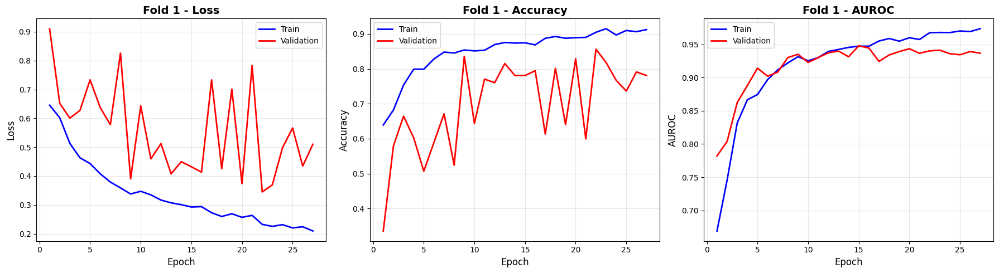

  Creating plots for Fold 2...


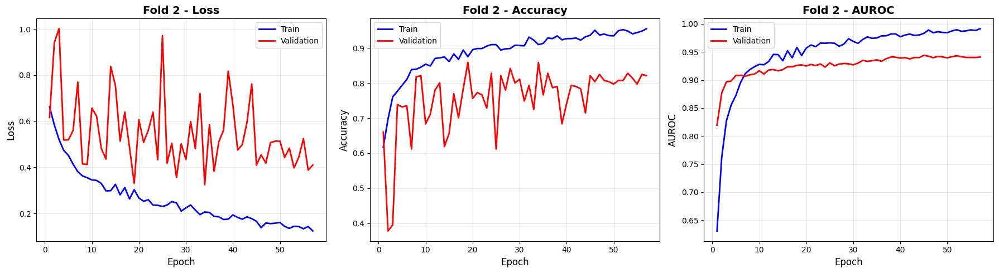

  Creating plots for Fold 3...


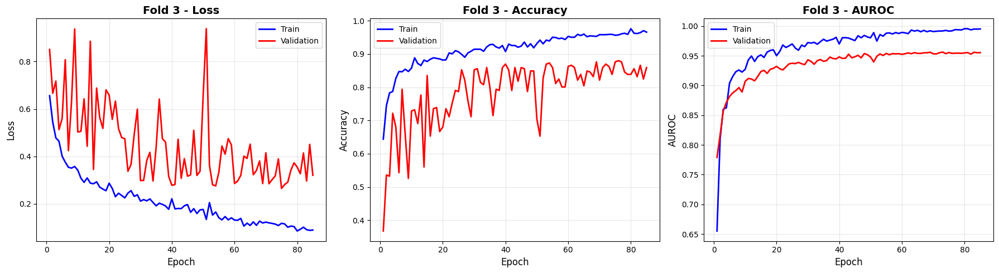

  Creating plots for Fold 4...


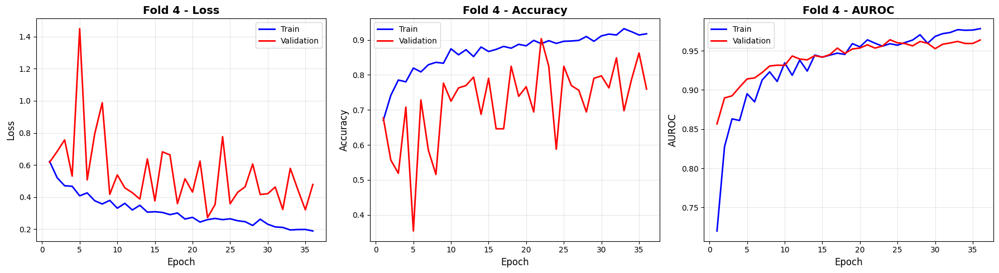

  Creating plots for Fold 5...


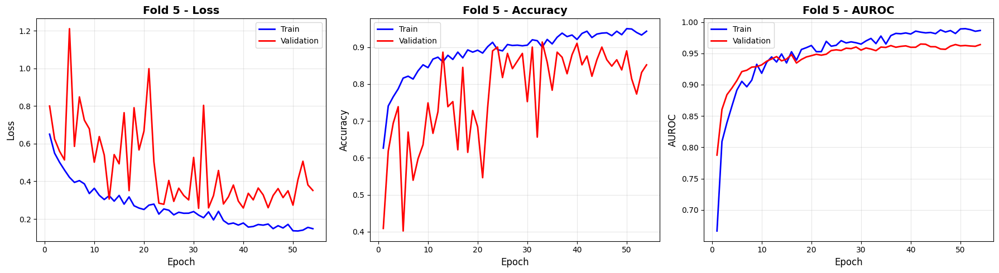


--------------------------------------------------------------------------------
Generating aggregated cross-validation plots...
--------------------------------------------------------------------------------



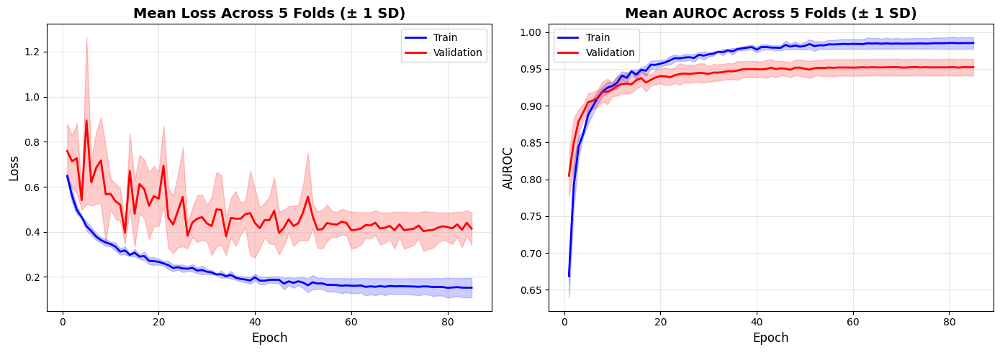


All visualization plots generated successfully!
Plots saved to: /kaggle/working/400x_res

Summary Table of All Folds:
--------------------------------------------------------------------------------
Fold     Best Epoch      Best Val AUROC       Final Train AUROC   
--------------------------------------------------------------------------------
1        15              0.9479               0.9738              
2        45              0.9441               0.9916              
3        73              0.9561               0.9950              
4        24              0.9641               0.9782              
5        42              0.9649               0.9865              
--------------------------------------------------------------------------------
Mean     -               0.9554               0.9850              
Std      -               0.0084               0.0080              
--------------------------------------------------------------------------------


-------------------

In [22]:
print(f"\n{'='*80}")
print("=" + " " * 78 + "=")
print("=" + " " * 25 + "GENERATING VISUALIZATIONS" + " " * 29 + "=")
print("=" + " " * 78 + "=")
print(f"{'='*80}\n")

# Plot individual fold metrics
print("Generating individual fold plots...")
for fold_num, history in enumerate(all_fold_histories, 1):
    print(f"  Creating plots for Fold {fold_num}...")
    plot_fold_metrics(history, fold_num, CONFIG['output_dir'])

print("\n" + "-" * 80)
print("Generating aggregated cross-validation plots...")
print("-" * 80 + "\n")

# Plot aggregated metrics (mean ± std across all folds)
plot_aggregated_metrics(all_fold_histories, CONFIG['output_dir'])

print("\n" + "="*80)
print("All visualization plots generated successfully!")
print(f"Plots saved to: {CONFIG['output_dir']}")
print("="*80 + "\n")

# Create a summary table
print("Summary Table of All Folds:")
print("-" * 80)
print(f"{'Fold':<8} {'Best Epoch':<15} {'Best Val AUROC':<20} {'Final Train AUROC':<20}")
print("-" * 80)
for result in all_fold_results:
    print(f"{result['fold']:<8} {result['best_epoch']:<15} "
          f"{result['best_val_auroc']:<20.4f} {result['final_train_auroc']:<20.4f}")
print("-" * 80)
print(f"{'Mean':<8} {'-':<15} {mean_auroc:<20.4f} {np.mean(train_aurocs):<20.4f}")
print(f"{'Std':<8} {'-':<15} {std_auroc:<20.4f} {np.std(train_aurocs):<20.4f}")
print("-" * 80 + "\n")
############################################################
# SMOOTHENED MULTI-FOLD EPOCH-WISE COMPARISON PLOTS
############################################################

import matplotlib.pyplot as plt
import numpy as np
import os

def smooth_curve(values, window=5):
    """Simple moving average smoothing"""
    if len(values) < window:
        return values
    return np.convolve(values, np.ones(window)/window, mode='valid')

print("\n" + "-" * 80)
print("Generating smoothened epoch-wise comparison plots (ALL FOLDS)...")
print("-" * 80 + "\n")

# =======================
# LOSS vs EPOCH (ALL FOLDS)
# =======================
plt.figure(figsize=(10, 6))

for fold_num, history in enumerate(all_fold_histories, 1):
    loss = history['train_loss'] if 'train_loss' in history else history['loss']
    smooth_loss = smooth_curve(loss, window=5)
    epochs = range(1, len(smooth_loss) + 1)

    plt.plot(epochs, smooth_loss, label=f'Fold {fold_num}')

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Smoothened Training Loss vs Epoch (All Folds)")
plt.legend()
plt.grid(True)

loss_path = os.path.join(CONFIG['output_dir'], "all_folds_loss_vs_epoch_smooth.png")
plt.savefig(loss_path, dpi=300, bbox_inches='tight')
plt.close()

# ==========================
# ACCURACY vs EPOCH (ALL FOLDS)
# ==========================
plt.figure(figsize=(10, 6))

for fold_num, history in enumerate(all_fold_histories, 1):
    acc = history['train_acc'] if 'train_acc' in history else history['accuracy']
    smooth_acc = smooth_curve(acc, window=5)
    epochs = range(1, len(smooth_acc) + 1)

    plt.plot(epochs, smooth_acc, label=f'Fold {fold_num}')

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Smoothened Training Accuracy vs Epoch (All Folds)")
plt.legend()
plt.grid(True)

acc_path = os.path.join(CONFIG['output_dir'], "all_folds_accuracy_vs_epoch_smooth.png")
plt.savefig(acc_path, dpi=300, bbox_inches='tight')
plt.close()

print("✔ Smoothened multi-fold comparison plots generated successfully!")
print(f"  • Loss plot saved to: {loss_path}")
print(f"  • Accuracy plot saved to: {acc_path}")


In [23]:
def plot_aggregated_metrics(all_histories, save_dir):
    import numpy as np
    import matplotlib.pyplot as plt

    # ---------- GET MINIMUM EPOCH LENGTH ACROSS ALL FOLDS ----------
    min_epochs = min(len(df) for df in all_histories)

    # ---------- STACK WITH TRUNCATION ----------
    train_losses = np.array([df["train_loss"][:min_epochs] for df in all_histories])
    val_losses   = np.array([df["val_loss"][:min_epochs] for df in all_histories])
    train_accs   = np.array([df["train_acc"][:min_epochs] for df in all_histories])
    val_accs     = np.array([df["val_acc"][:min_epochs] for df in all_histories])
    train_aurocs = np.array([df["train_auroc"][:min_epochs] for df in all_histories])
    val_aurocs   = np.array([df["val_auroc"][:min_epochs] for df in all_histories])

    metrics = {
        "Train Loss": train_losses,
        "Validation Loss": val_losses,
        "Train Accuracy": train_accs,
        "Validation Accuracy": val_accs,
        "Train AUROC": train_aurocs,
        "Validation AUROC": val_aurocs
    }

    # ---------- PLOT ALL METRICS ----------
    for metric_name, values in metrics.items():
        plt.figure(figsize=(10, 6))
        mean = values.mean(axis=0)
        std = values.std(axis=0)

        plt.plot(mean, label=f"{metric_name} Mean")
        plt.fill_between(range(len(mean)), mean - std, mean + std, alpha=0.3)
        plt.title(f"Aggregated Cross-Validation: {metric_name}")
        plt.xlabel("Epoch")
        plt.ylabel(metric_name)
        plt.legend()

        plt.savefig(f"{save_dir}/cv_{metric_name.replace(' ', '_').lower()}.png")
        plt.close()


Loaded 364 images from /kaggle/working/400X_structured/test
  Benign: 118, Malignant: 246


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Loaded dinov2_vitl14 (frozen=True)

--- Evaluating Fold 1 ---
✅ Loaded weights for Fold 1


Testing Fold 1: 100%|██████████| 23/23 [00:20<00:00,  1.13it/s]



--- Evaluating Fold 2 ---
✅ Loaded weights for Fold 2


Testing Fold 2: 100%|██████████| 23/23 [00:21<00:00,  1.06it/s]



--- Evaluating Fold 3 ---
✅ Loaded weights for Fold 3


Testing Fold 3: 100%|██████████| 23/23 [00:22<00:00,  1.04it/s]



--- Evaluating Fold 4 ---
✅ Loaded weights for Fold 4


Testing Fold 4: 100%|██████████| 23/23 [00:21<00:00,  1.09it/s]



--- Evaluating Fold 5 ---
✅ Loaded weights for Fold 5


Testing Fold 5: 100%|██████████| 23/23 [00:21<00:00,  1.09it/s]



FINAL ENSEMBLE TEST RESULTS
Accuracy: 0.8269
AUROC:    0.9605


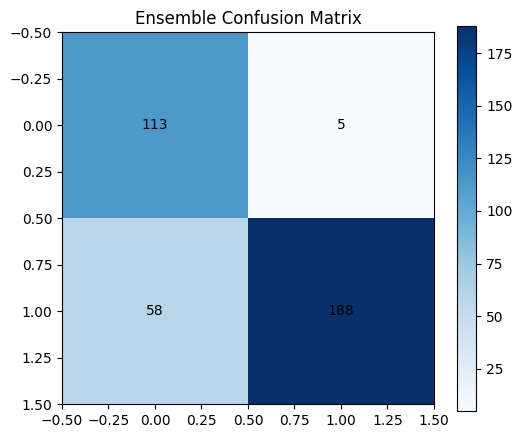

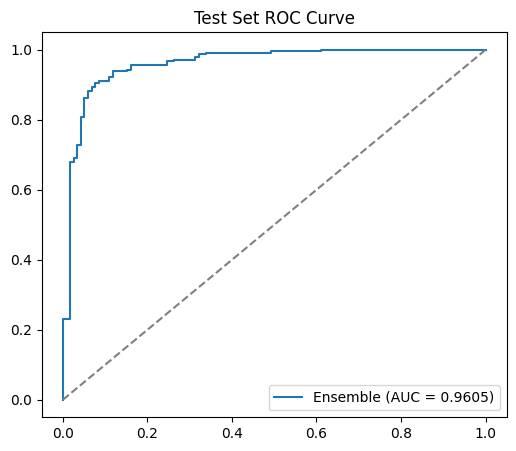

In [24]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import json
from tqdm import tqdm
from torch.utils.data import DataLoader
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve
from collections import OrderedDict

# ===============================
# 1. SETUP DATA LOADER (FIXES NAMEERROR)
# ===============================
# Define transforms and dataset first
test_dir = os.path.join(CONFIG['data_root'], 'test')
test_dataset = BreastCancerDataset(test_dir, transform=val_test_transforms)

test_loader = DataLoader(
    test_dataset,
    batch_size=CONFIG['batch_size'],
    shuffle=False,
    num_workers=CONFIG['num_workers'],
    pin_memory=True
)

# ===============================
# 2. INITIALIZE MODELS
# ===============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize DINOv2 Feature Extractor
trained_feature_extractor = DINOv2FeatureExtractor(
    model_name=CONFIG["dinov2_model"], 
    freeze=True
).to(device)
trained_feature_extractor.eval()

# ===============================
# 3. ENSEMBLE INFERENCE (5 FOLDS)
# ===============================
all_fold_probabilities = []
true_labels = []

# Loop through all 5 folds to create a powerful ensemble
for fold_num in range(1, 6):
    print(f"\n--- Evaluating Fold {fold_num} ---")
    
    # Initialize a fresh classifier for this fold
    classifier = MLPClassifier(
        input_dim=CONFIG["feature_dim"],
        num_classes=2,
        hidden_dims=CONFIG["hidden_dims"],
        dropout=CONFIG["dropout"]
    ).to(device)

    # Load Weights with "module." prefix fix
    checkpoint_path = os.path.join(CONFIG['checkpoint_dir'], f'fold_{fold_num}_best.pth')
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
        state_dict = checkpoint["classifier_state_dict"]
        
        new_state_dict = OrderedDict()
        for k, v in state_dict.items():
            name = k.replace("module.", "") 
            new_state_dict[name] = v
        
        classifier.load_state_dict(new_state_dict)
        classifier.eval()
        print(f"✅ Loaded weights for Fold {fold_num}")
    else:
        print(f"⚠️ Skip: Fold {fold_num} checkpoint not found.")
        continue

    fold_probs = []
    temp_labels = []

    with torch.no_grad():
        for images, labels, _ in tqdm(test_loader, desc=f"Testing Fold {fold_num}"):
            images = images.to(device)
            features = trained_feature_extractor(images)
            outputs = classifier(features)
            
            probs = torch.softmax(outputs, dim=1)[:, 1]
            fold_probs.extend(probs.cpu().numpy())
            if fold_num == 1: # Only need labels once
                temp_labels.extend(labels.numpy())

    all_fold_probabilities.append(fold_probs)
    if fold_num == 1:
        true_labels = np.array(temp_labels)

# ===============================
# 4. CALCULATE ENSEMBLE METRICS
# ===============================
# Average the probabilities across all 5 folds
ensemble_probs = np.mean(all_fold_probabilities, axis=0)
ensemble_preds = (ensemble_probs > 0.5).astype(int)

test_auroc = roc_auc_score(true_labels, ensemble_probs)
test_acc = np.mean(ensemble_preds == true_labels)
cm = confusion_matrix(true_labels, ensemble_preds)

print(f"\n{'='*30}")
print(f"FINAL ENSEMBLE TEST RESULTS")
print(f"Accuracy: {test_acc:.4f}")
print(f"AUROC:    {test_auroc:.4f}")
print(f"{'='*30}")

# ===============================
# 5. VISUALIZATION
# ===============================
# Confusion Matrix
plt.figure(figsize=(6, 5))
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Ensemble Confusion Matrix")
plt.colorbar()
for i, j in np.ndindex(cm.shape):
    plt.text(j, i, cm[i, j], ha="center", va="center")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(true_labels, ensemble_probs)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'Ensemble (AUC = {test_auroc:.4f})')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.title('Test Set ROC Curve')
plt.legend()
plt.savefig(os.path.join(CONFIG['output_dir'], "ensemble_test_roc.png"))
plt.show()

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Loaded dinov2_vitl14 (frozen=True)

############################################################
#                                                          #
#               STARTING XAI ANALYSIS                      #
#                                                          #
############################################################

Analyzing image SOB_M_DC-14-12312-400-031.png (Label: Malignant)
  Prediction: Malignant (prob: 0.9905)


  Agreement - IoU: 0.0110, Correlation: -0.0693


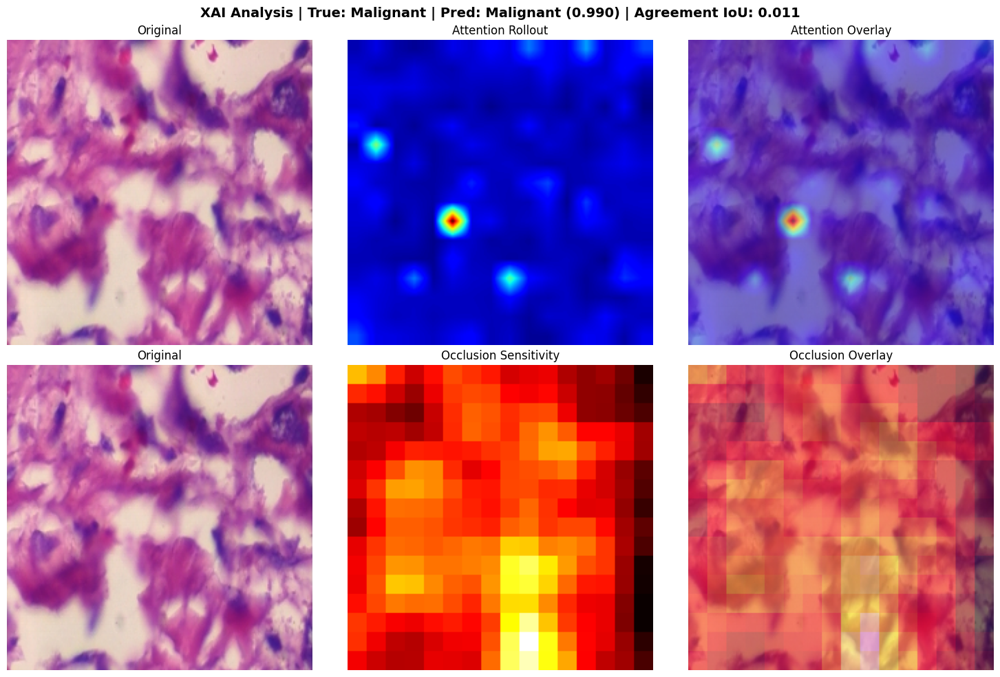

Analyzing image SOB_B_TA-14-15275-400-014.png (Label: Benign)
  Prediction: Benign (prob: 0.1933)


  Agreement - IoU: 0.0037, Correlation: -0.0333


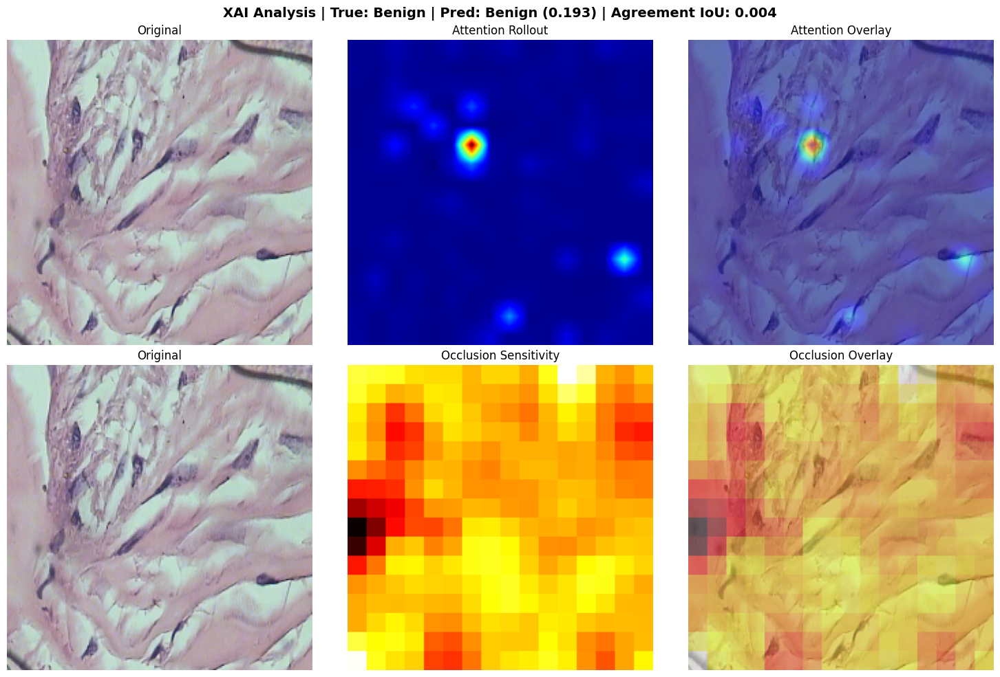

Analyzing image SOB_B_F-14-14134E-400-008.png (Label: Benign)
  Prediction: Benign (prob: 0.0401)


  Agreement - IoU: 0.0047, Correlation: 0.0701


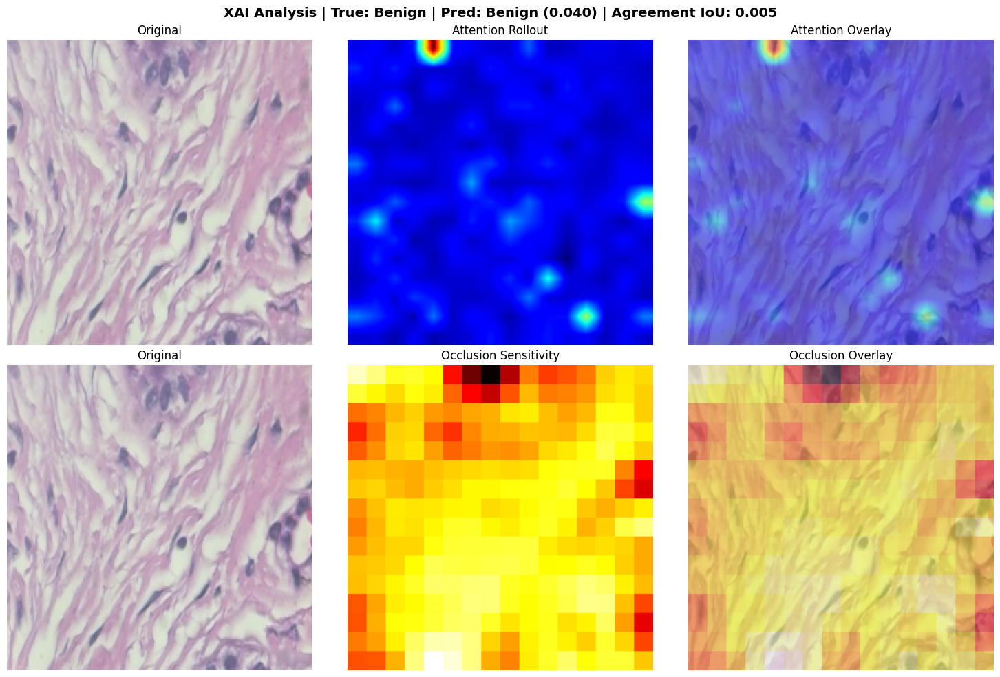

Analyzing image SOB_M_PC-14-15704-400-023.png (Label: Malignant)
  Prediction: Benign (prob: 0.4722)


  Agreement - IoU: 0.0081, Correlation: 0.0703


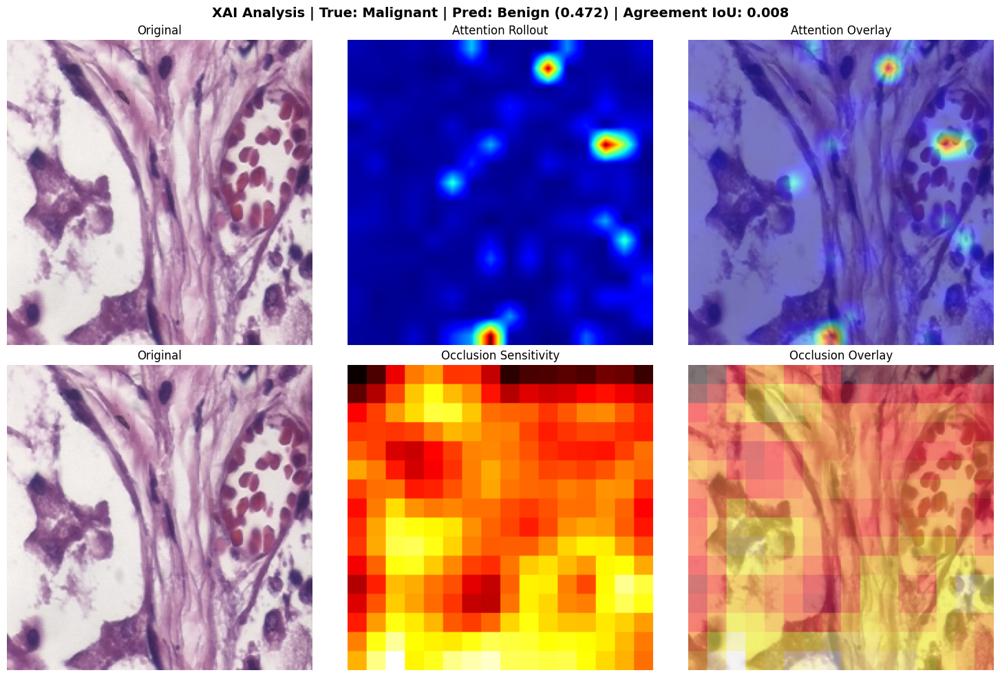

Analyzing image SOB_B_TA-14-21978AB-400-002.png (Label: Benign)
  Prediction: Benign (prob: 0.0415)


  Agreement - IoU: 0.0024, Correlation: -0.1212


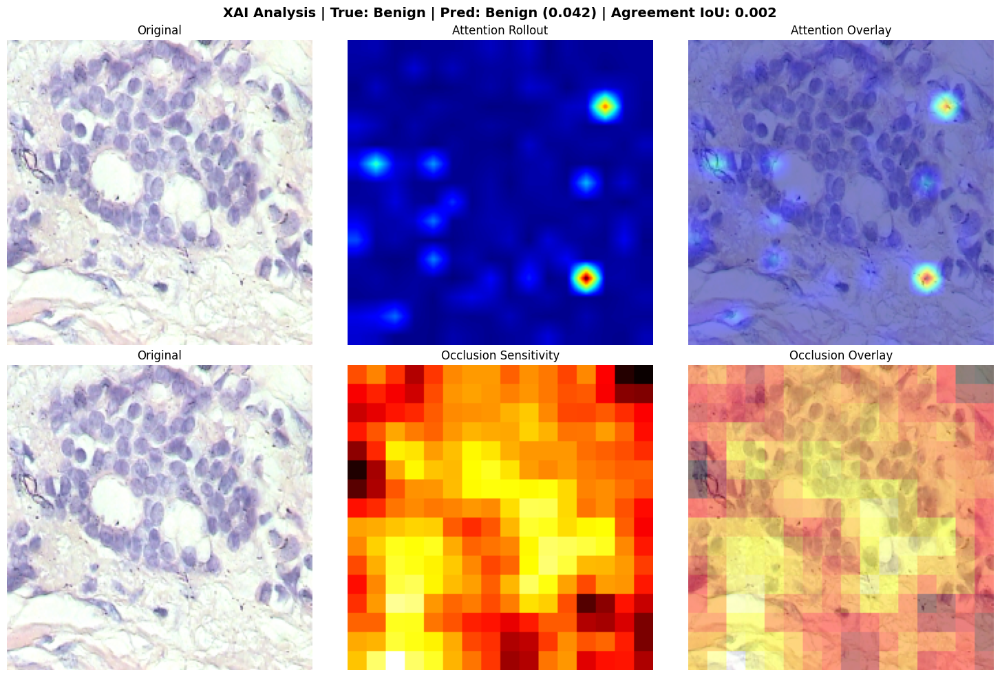


############################################################
#                   XAI ANALYSIS COMPLETE!                   #
############################################################

Mean IoU: 0.0060
Mean Correlation: -0.0167


In [25]:
feature_extractor = DINOv2FeatureExtractor(
    model_name=CONFIG["dinov2_model"],  # 'dinov2_vitl14'
    freeze=True
).to(device)

feature_extractor.eval()
agreement_scores = perform_xai_analysis(
    feature_extractor=feature_extractor,
    classifier=classifier,
    test_dataset=test_dataset,
    device=device,
    config=CONFIG,
    num_samples=5   # change as needed
)


In [26]:
from PIL import Image
import torch
from torch.utils.data import Dataset
import os
import torchvision.transforms as T

# Define simple dataset for XAI
class BACHDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label, img_path
# Example: take 1 image from benign and 1 from invasive
bach_base = "/kaggle/input/bachhhh/ICIAR2018_BACH_Challenge/Photos"  # root folder of tif images
classes = ["Benign", "InSitu", "Invasive", "Normal"]

# Select 2 images manually
img1_path = os.path.join(bach_base, "Benign", "b009.tif")
img2_path = os.path.join(bach_base, "Invasive", "iv009.tif")

image_paths = [img1_path, img2_path]
labels = [0, 1]  # encode as you wish (0=benign, 1=invasive for example)

# Transforms same as used in training
transform = T.Compose([
    T.Resize((224, 224)),        # or whatever your DINO model expects
    T.ToTensor(),
    T.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

bach_test_dataset = BACHDataset(image_paths, labels, transform=transform)



############################################################
#                                                          #
#               STARTING XAI ANALYSIS                      #
#                                                          #
############################################################

Analyzing image b009.tif (Label: Benign)
  Prediction: Malignant (prob: 0.9946)


  Agreement - IoU: 0.0202, Correlation: -0.0343


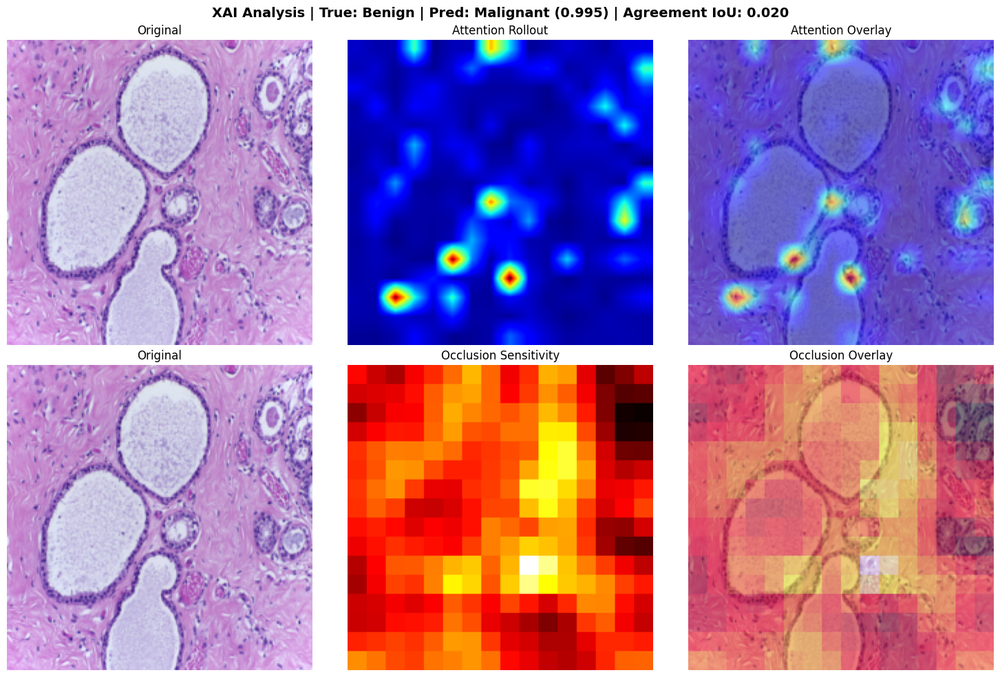

Analyzing image iv009.tif (Label: Malignant)
  Prediction: Malignant (prob: 0.9777)


  Agreement - IoU: 0.0097, Correlation: -0.1032


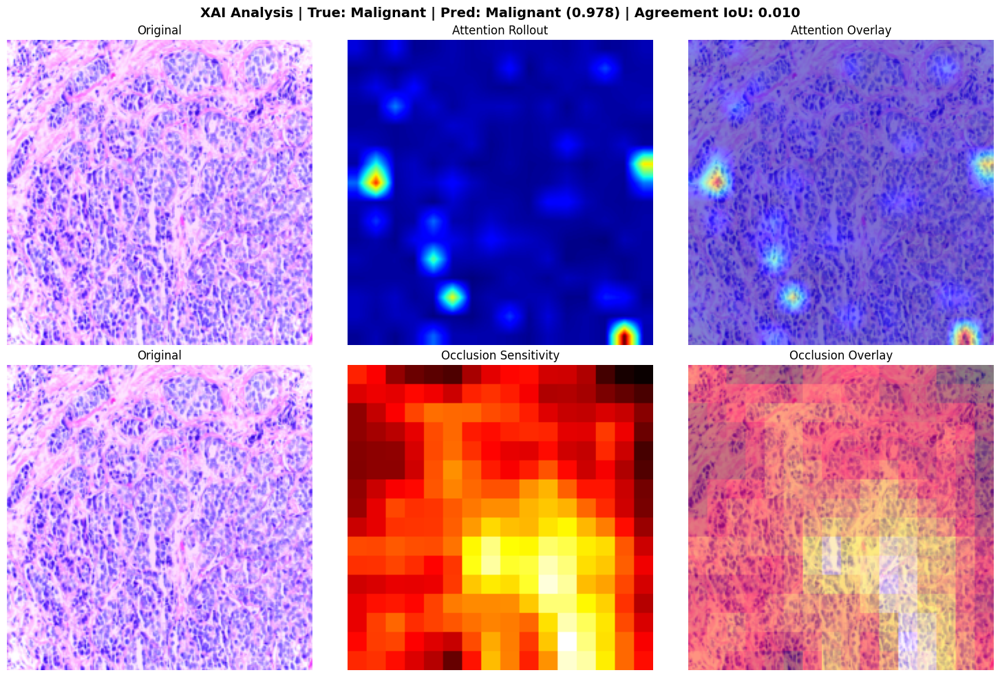


############################################################
#                   XAI ANALYSIS COMPLETE!                   #
############################################################

Mean IoU: 0.0149
Mean Correlation: -0.0687


In [27]:
feature_extractor.eval()
classifier.eval()

# Only 2 images, so set num_samples=2
agreement_scores = perform_xai_analysis(
    feature_extractor=feature_extractor,
    classifier=classifier,
    test_dataset=bach_test_dataset,
    device=device,
    config=CONFIG,
    num_samples=2
)
